In [4]:
# conda activate dl

# manipulation
import pandas as pd
import numpy as np
import os

# dim redo
from bio_embeddings.project import tsne_reduce
from bio_embeddings.project import umap_reduce
from sklearn.decomposition import PCA

# viz
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px 
! pwd 

/home/gama/bla_analysis/notebooks


This notebook shows the procedure of dim redo using PCA, tSNE and UMAP

# load data source

In [2]:
def do_iscatter(df, x, y, annot):
    
    """
    do a scatterplot given a df and hue
    """
   
    # plot
    fig = px.scatter(
    df, x = x, y = y,
    height = 800, width = 900, color = annot,
    hover_name = "protein_name", 
    color_discrete_sequence = px.colors.qualitative.Plotly,
    hover_data = [
        "#name", "protein_family_header", "length", 'protein_family',"protein_family_header", 'bla_class'])

    fig.update_traces(marker=dict(size=8, line=dict(width=1,color='black')),selector=dict(mode='markers'))
    fig.update_layout(template="plotly_white")
    #fig.update_xaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey',mirror=True)
    #fig.update_yaxes(showgrid=True, gridwidth=0.5, gridcolor='LightGrey', mirror=True)
    fig.update_yaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.update_xaxes(showline=True, linewidth=1, linecolor='LightGrey')
    fig.show()

In [3]:
#load data 
df_plm = pd.read_pickle("../results/embeddings/all_plm.pkl")
df_plm.pop("seq")
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")
df = pd.merge(df_annot, df_plm, on = "seq_id", how = "left")

# remove LRA-5 and varG
df = df.iloc[:-1 , :]
df = df[df.bla_class.str.contains("Class A|Class B|Class C|Class D|Consensus|Ancestral|Risso")]
df

,#name,seq,length,filename,protein_name,protein_family,bla_class,bla_subclass,protein_family_header,seq_id,...,seq_without_sigpept,esm1b,esm,onehot,t5xlu50,t5bfd,xlnet,bepler,carp640M,carp640M_logp
0,gi|5596421|emb|CAB51471.1|ACI-1| class A exten...,MKKFCFLFLIICGLMVFCLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-1-prot.fasta,ACI-1,ACI,Class A,Class A,ACI,seq_0,...,CQARQKLNLADLENKYNAVIGVYAVDMENGKKICYKPDTRFSYCST...,"[0.1102982, 0.014699467, -0.14032564, 0.258299...","[-1.9012868, 0.22372644, 0.21296117, -0.166722...","[0.08450704, 0.024647888, 0.08450704, 0.045774...","[0.008956722, 0.02665889, 0.02402008, 0.014990...","[0.023663048, -0.0007369746, -0.0076412507, 0....","[-0.19811592, 0.051563144, -0.005958873, 0.039...","[0.08450704, 0.045774646, 0.07042254, 0.084507...","[8.911173, 9.043713, 2.4614172, 12.103228, -8....",-0.294909
1,AHN92697.1|ACI-2| beta-lactamase [uncultured b...,MKKFCFLFLIICGLMFFCLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-2-prot.fasta,ACI-2,ACI,Class A,Class A,ACI,seq_1,...,CQARQKLNLADLENKYNAVIGVYAVDMENGKKICYKPDTRFSYCST...,"[0.10703633, 0.017742604, -0.14941521, 0.25984...","[-1.91362, 0.15840982, 0.18624821, -0.169153, ...","[0.08098592, 0.024647888, 0.08450704, 0.042253...","[0.0076766736, 0.027014462, 0.027420135, 0.013...","[0.026570462, 0.0026666287, -0.006873358, -0.0...","[-0.21204372, 0.057212643, -0.011840693, 0.035...","[0.08098592, 0.045774646, 0.07042254, 0.084507...","[8.887652, 9.320681, 2.41787, 12.194232, -8.64...",-0.292038
2,EHO64028.1|ACI-3| hypothetical protein HMPREF9...,MKKFCFLFLIICGLMVFSLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-3-prot.fasta,ACI-3,ACI,Class A,Class A,ACI,seq_2,...,CQARQKLNLADLENKYNAVIGVYAVDMENGKKICYKPDTRFSYCST...,"[0.10849612, 0.017496616, -0.14619425, 0.26836...","[-1.8146169, 0.20834586, 0.23776329, -0.163906...","[0.08450704, 0.02112676, 0.08450704, 0.0457746...","[0.009324158, 0.02478514, 0.022525383, 0.01392...","[0.02341963, -0.004910054, -0.008731285, 0.005...","[-0.1872002, 0.043762427, -0.03699141, 0.03243...","[0.08450704, 0.045774646, 0.07042254, 0.084507...","[8.827172, 8.74543, 2.4937172, 12.3279085, -8....",-0.287659
3,AHN92696.1|ACI-4| beta-lactamase [uncultured b...,MKKFCFLFLIICGLMVFCLQGCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-4-prot.fasta,ACI-4,ACI,Class A,Class A,ACI,seq_3,...,CQARQKLNLADLENKYNAVIGVYAVDMENGKKICYKPDTRFSYCST...,"[0.12845756, 0.017484514, -0.13535379, 0.24379...","[-1.8452643, 0.23816845, 0.23408653, -0.152660...","[0.08450704, 0.024647888, 0.08098592, 0.045774...","[0.004128871, 0.033653855, 0.028860169, 0.0124...","[0.014434682, -0.0026827375, -0.003042692, 0.0...","[-0.2078117, 0.05418699, 0.0056420905, 0.02040...","[0.08450704, 0.045774646, 0.07042254, 0.080985...","[8.501886, 9.030052, 2.3223486, 11.952613, -9....",-0.289380
4,AMP55835.1|ACI-5| classA [uncultured bacterium],MKKFCFLFLIICGLMVFCLQDCQARQKLNLADLENKYNAVIGVYAV...,284,A-ACI-5-prot.fasta,ACI-5,ACI,Class A,Class A,ACI,seq_4,...,CQARQKLNLADLENKYNAVIGVYAVDMENGKKICYKPDTRFSYCST...,"[0.10706033, 0.013306678, -0.14212927, 0.25449...","[-1.8473366, 0.2200377, 0.23291773, -0.1457919...","[0.08450704, 0.024647888, 0.08450704, 0.045774...","[0.0077304444, 0.029016294, 0.023319585, 0.014...","[0.020652149, -0.00015262279, -0.0065017454, 0...","[-0.19173458, 0.04517981, -0.0330168, 0.023556...","[0.08450704, 0.045774646, 0.07042254, 0.084507...","[8.907578, 8.904117, 2.4000638, 12.001774, -9....",-0.287441
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25816,ENCA,MHPQTLEQIKESESQLSGRVGMVELDLASGRTLSYRADERFPMMST...,263,ENCA,ENCA,Ancestral,Ancestral,Ancestral,Ancestral,seq_25816,...,MHPQTLEQIKESESQLSGRVGMVELDLASGRTLSYRADERFPMMST...,"[0.06821247, -0.008263558, -0.035088044, 0.155...","[-1.3510801, -0.12951511, 0.31293106, -0.54279...","[0.121673, 0.0076045627, 0.05703422, 0.0722433...","[0.036983196, 0.084664896, 0.03534185, 0.05482...","[0.042047616, 0.01768007, -0.008149116, 0.0520...","[-0.43289712, 0.292488, -0.044813067, -0.41627...","[0.121673, 0.072243

In [4]:
df.columns

Index(['#name', 'seq', 'length', 'filename', 'protein_name', 'protein_family',
       'bla_class', 'bla_subclass', 'protein_family_header', 'seq_id',
       'molecular_weight', 'aromaticity', 'instability', 'gravy',
       'isoelectric_point', 'entropy', 'helix', 'turn', 'sheet',
       'is_clust90_rep', 'bitscore', 'Domain', 'Phylum', 'Class', 'Order',
       'Family', 'Genus', 'Species', 'predicted_signal_peptide',
       'Other_sigpept', 'SP(Sec/SPI)', 'LIPO(Sec/SPII)', 'TAT(Tat/SPI)',
       'TATLIPO(Sec/SPII)', 'PILIN(Sec/SPIII)', 'CS Position',
       'seq_without_sigpept', 'esm1b', 'esm', 'onehot', 't5xlu50', 't5bfd',
       'xlnet', 'bepler', 'carp640M', 'carp640M_logp'],
      dtype='object')

In [5]:
# reanme onehot col as aa_composition 
df = df.rename(columns={'onehot': 'aa_composition'})
df.columns

Index(['#name', 'seq', 'length', 'filename', 'protein_name', 'protein_family',
       'bla_class', 'bla_subclass', 'protein_family_header', 'seq_id',
       'molecular_weight', 'aromaticity', 'instability', 'gravy',
       'isoelectric_point', 'entropy', 'helix', 'turn', 'sheet',
       'is_clust90_rep', 'bitscore', 'Domain', 'Phylum', 'Class', 'Order',
       'Family', 'Genus', 'Species', 'predicted_signal_peptide',
       'Other_sigpept', 'SP(Sec/SPI)', 'LIPO(Sec/SPII)', 'TAT(Tat/SPI)',
       'TATLIPO(Sec/SPII)', 'PILIN(Sec/SPIII)', 'CS Position',
       'seq_without_sigpept', 'esm1b', 'esm', 'aa_composition', 't5xlu50',
       't5bfd', 'xlnet', 'bepler', 'carp640M', 'carp640M_logp'],
      dtype='object')

In [6]:
models = ['esm1b', 'esm', 'aa_composition', 't5xlu50', 't5bfd', 'xlnet', 'bepler', 'carp640M']

In [7]:
# df of serin betalactamases
df_sbl = df[~df.bla_class.str.contains("Class B|Consensus")]

# df of metalobetalactamases
df_mbl = df[df.bla_class.str.contains("Class B")]

# consensus
df_cons   = df[df.bla_class.str.contains("Consensus")]
df_cons_sbl = df_cons[~df_cons.protein_name.str.contains("class_b")]
df_cons_mbl = df_cons[df_cons.protein_name.str.contains("class_b")]

# concat data
df_sbl = pd.concat([df_cons_sbl, df_sbl])
df_mbl = pd.concat([df_cons_mbl, df_mbl])

# reset idx
df_sbl = df_sbl.reset_index(drop=True)
df_mbl = df_mbl.reset_index(drop=True)

In [8]:
# create dirs to save data
! tree -L 1 ../results/dim_redo/splitted_classes

../results/dim_redo/splitted_classes
├── pca
├── tsne
└── umap

3 directories, 0 files


# UMAP

umap is a nonlinear algorithm of dim redo that depends on more params than tSNE, i.e., n_neighbors (similar to perplexity), spread and min_dist, that together represent the local or global landscape of the manifold. Also, as it loss functions is composed, there is not easy way to evaluate the results as with KL-div in tSNE.

1. n_neighbors: (analog of perplexity in tsne) low vals force to concentrate on very local structure, large vals will push UMAP to look at larger neighborhoods of each point when estimating the manifold structure of the data, losing fine detail (default vals are set to 15). 

2. min_dist: low values result in clumpier embeddings (useful if you are interested in clustering, or in finer topological structure), larger vals focus on the preservation of the broad topological structure instead. The value of min_dist should be set relative to the spread value, which determines the scale at which embedded points will be spread out. (default vals are set to 0.1)

3. spread: the effective scale of embedded points. In combination with min_dist, this determines how clustered/clumped the embedded points ar

Useful post:
- https://pair-code.github.io/understanding-umap/
- https://arxiv.org/abs/2012.04456
- https://www.nature.com/articles/s41587-020-00809-z 
- https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1006907
- https://towardsdatascience.com/tsne-vs-umap-global-structure-4d8045acba17 

## n_neighbors effect

### mbl


############# starting analysis for esm1b with n_neighbors = 5 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=5, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:40:16 2023 Construct fuzzy simplicial set
Sun Jan  8 20:40:24 2023 Finding Nearest Neighbors
Sun Jan  8 20:40:24 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:40:24 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:40:26 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_5_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 31 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=31, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:40:26 2023 Construct fuzzy simplicial set
Sun Jan  8 20:40:34 2023 Finding Nearest Neighbors
Sun Jan  8 20:40:34 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:40:34 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:40:38 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_31_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 56 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=56, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:40:38 2023 Construct fuzzy simplicial set
Sun Jan  8 20:40:46 2023 Finding Nearest Neighbors
Sun Jan  8 20:40:46 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:40:46 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:40:50 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_56_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 100 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=100, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:40:50 2023 Construct fuzzy simplicial set
Sun Jan  8 20:40:59 2023 Finding Nearest Neighbors
Sun Jan  8 20:40:59 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:40:59 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:41:04 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_100_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 150 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=150, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:41:04 2023 Construct fuzzy simplicial set
Sun Jan  8 20:41:12 2023 Finding Nearest Neighbors
Sun Jan  8 20:41:12 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:41:12 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:41:18 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_150_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 200 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=200, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:41:18 2023 Construct fuzzy simplicial set
Sun Jan  8 20:41:26 2023 Finding Nearest Neighbors
Sun Jan  8 20:41:26 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:41:26 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:41:33 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_200_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 250 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=250, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:41:33 2023 Construct fuzzy simplicial set
Sun Jan  8 20:41:41 2023 Finding Nearest Neighbors
Sun Jan  8 20:41:41 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:41:42 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:41:48 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_250_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 300 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=300, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:41:48 2023 Construct fuzzy simplicial set
Sun Jan  8 20:41:56 2023 Finding Nearest Neighbors
Sun Jan  8 20:41:56 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:41:57 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:42:03 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_300_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 350 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=350, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:42:03 2023 Construct fuzzy simplicial set
Sun Jan  8 20:42:12 2023 Finding Nearest Neighbors
Sun Jan  8 20:42:12 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:42:12 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:42:19 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_350_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 400 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:42:19 2023 Construct fuzzy simplicial set
Sun Jan  8 20:42:27 2023 Finding Nearest Neighbors
Sun Jan  8 20:42:27 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:42:28 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 20:42:35 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_mbl_400_esm1b.csv


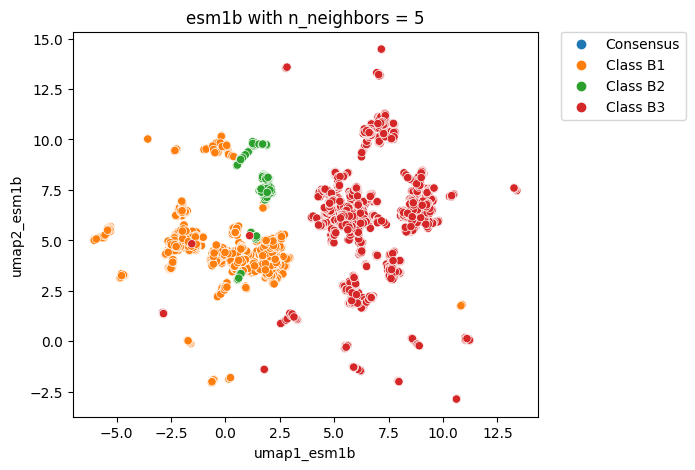

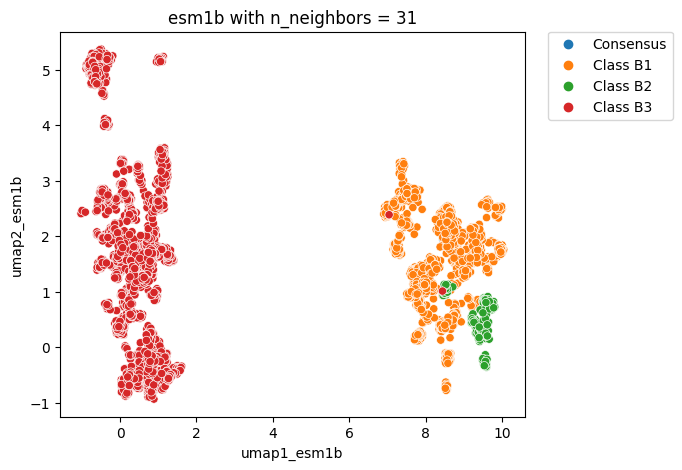

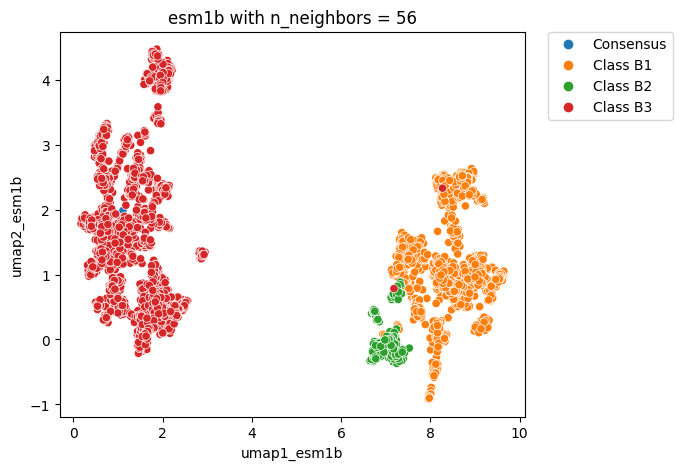

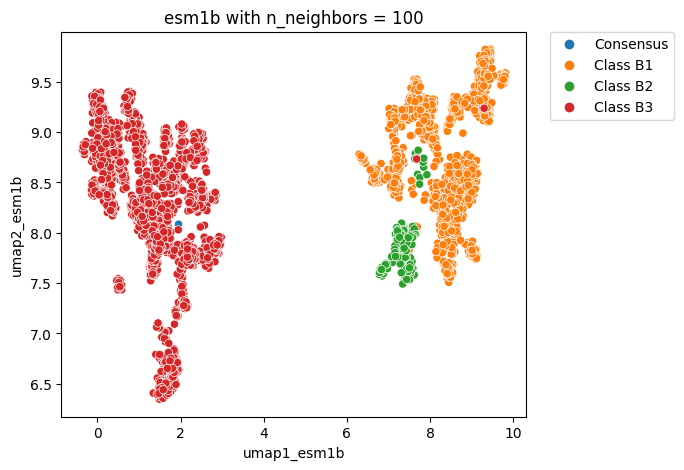

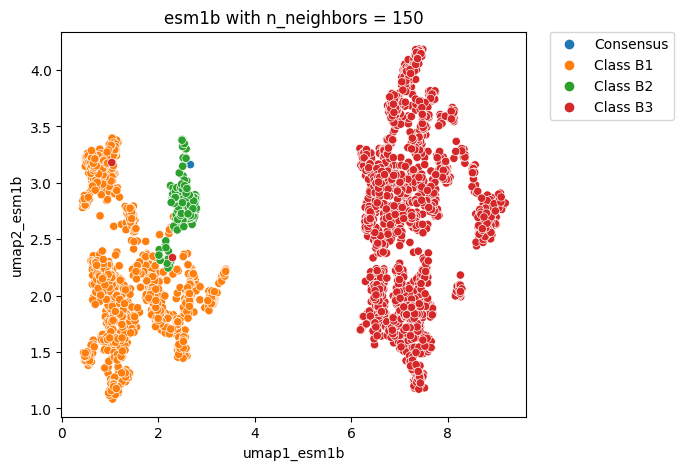

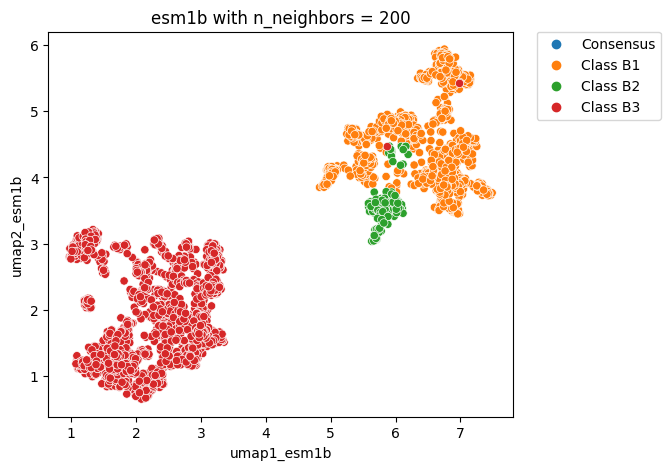

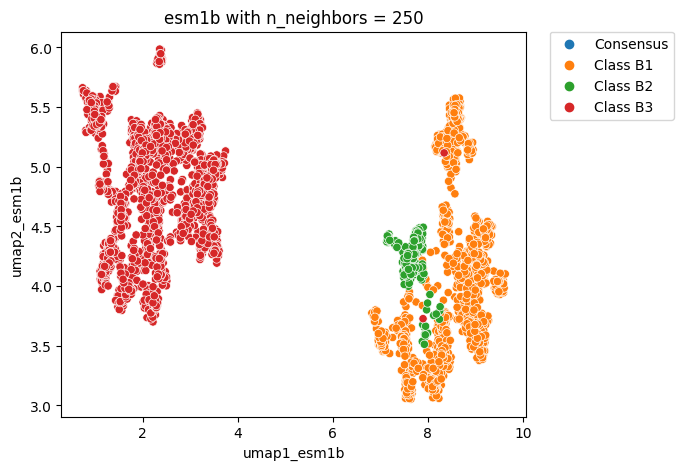

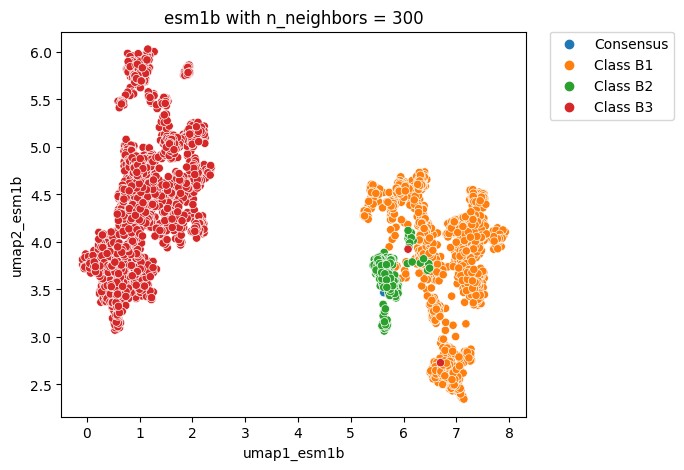

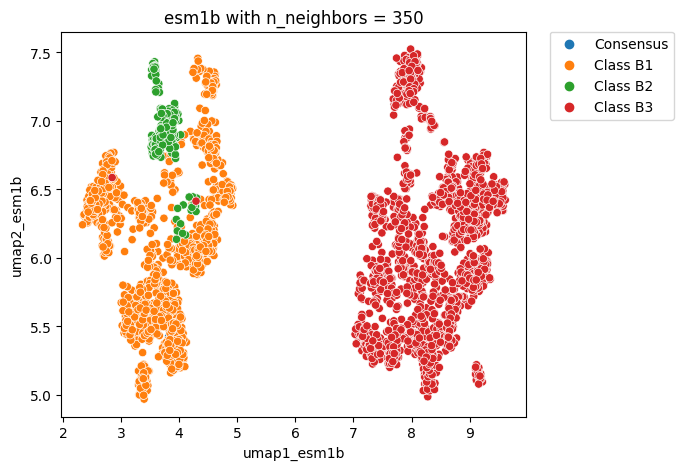

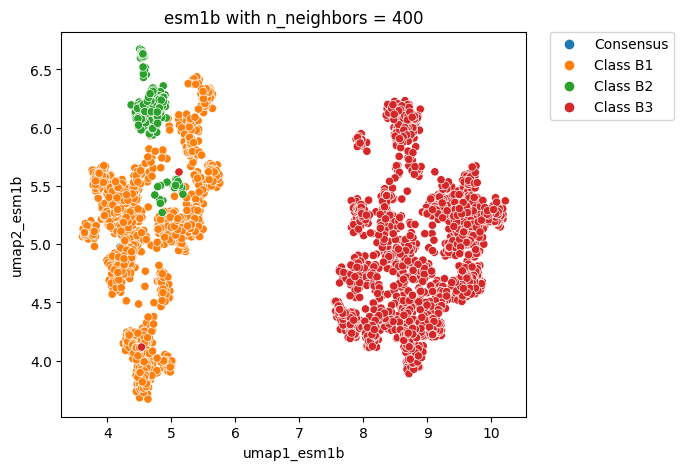

In [38]:
# set n_neigh vals to test
n_neighbors_lst = [5, 31, 56, 100, 150, 200, 250, 300, 350, 400]

for val  in n_neighbors_lst:
    
    # set names
    model = "esm1b"
    dim1 = "umap1_" + model
    dim2 = "umap2_" + model
    print(f"\n############# starting analysis for {model} with n_neighbors = {val} and spread/min_dist = 0.2 ###############\n")

    # compute umap
    umap_options = {"n_components": 2, "min_dist": 0.2, "spread": 0.2, "n_neighbors": val, "metric": "cosine"}
    proyected_dims = umap_reduce(df_mbl[model].to_list(), **umap_options)
    umap = pd.DataFrame(proyected_dims, columns=[dim1, dim2])
    umap = pd.concat([umap, df_mbl[["bla_subclass", "seq_id"]]], axis=1)
    
    # plot 
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data = umap, x = dim1, y = dim2, hue = "bla_subclass")
    plt.title(f"{model} with n_neighbors = {val}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    
    # save
    path = "../results/dim_redo/splitted_classes/umap/umap_2d_" + "nntest_mbl_" + str(val) +  "_" + model  + ".csv"
    umap.pop("bla_subclass")
    umap.to_csv(path, index = False)
    print(f"csv file saved as: {path}")

### sbl


############# starting analysis for esm1b with n_neighbors = 5 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=5, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:42:50 2023 Construct fuzzy simplicial set
Sun Jan  8 20:42:50 2023 Finding Nearest Neighbors
Sun Jan  8 20:42:50 2023 Building RP forest with 13 trees
Sun Jan  8 20:42:53 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:43:02 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:43:02 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:43:10 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_5_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 50 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=50, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:43:10 2023 Construct fuzzy simplicial set
Sun Jan  8 20:43:10 2023 Finding Nearest Neighbors
Sun Jan  8 20:43:10 2023 Building RP forest with 13 trees
Sun Jan  8 20:43:12 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	Stopping threshold met -- exiting after 2 iterations
Sun Jan  8 20:43:18 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:43:18 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:43:34 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_50_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 100 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=100, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:43:34 2023 Construct fuzzy simplicial set
Sun Jan  8 20:43:35 2023 Finding Nearest Neighbors
Sun Jan  8 20:43:35 2023 Building RP forest with 13 trees
Sun Jan  8 20:43:35 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:43:54 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:43:55 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:44:15 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_100_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 151 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=151, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:44:15 2023 Construct fuzzy simplicial set
Sun Jan  8 20:44:15 2023 Finding Nearest Neighbors
Sun Jan  8 20:44:15 2023 Building RP forest with 13 trees
Sun Jan  8 20:44:16 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:44:44 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:44:45 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:45:05 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_151_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 200 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=200, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:45:05 2023 Construct fuzzy simplicial set
Sun Jan  8 20:45:05 2023 Finding Nearest Neighbors
Sun Jan  8 20:45:05 2023 Building RP forest with 13 trees
Sun Jan  8 20:45:05 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:45:35 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:45:37 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:45:59 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_200_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 227 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=227, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:46:00 2023 Construct fuzzy simplicial set
Sun Jan  8 20:46:00 2023 Finding Nearest Neighbors
Sun Jan  8 20:46:00 2023 Building RP forest with 13 trees
Sun Jan  8 20:46:00 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:46:31 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:46:32 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:46:54 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_227_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 250 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=250, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:46:54 2023 Construct fuzzy simplicial set
Sun Jan  8 20:46:54 2023 Finding Nearest Neighbors
Sun Jan  8 20:46:54 2023 Building RP forest with 13 trees
Sun Jan  8 20:46:55 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:47:25 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:47:27 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:47:51 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_250_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 300 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=300, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:47:51 2023 Construct fuzzy simplicial set
Sun Jan  8 20:47:51 2023 Finding Nearest Neighbors
Sun Jan  8 20:47:51 2023 Building RP forest with 13 trees
Sun Jan  8 20:47:51 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:48:27 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:48:29 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:48:53 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_300_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 350 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=350, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:48:54 2023 Construct fuzzy simplicial set
Sun Jan  8 20:48:54 2023 Finding Nearest Neighbors
Sun Jan  8 20:48:54 2023 Building RP forest with 13 trees
Sun Jan  8 20:48:54 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:49:28 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:49:30 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:49:54 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_350_esm1b.csv

############# starting analysis for esm1b with n_neighbors = 400 and spread/min_dist = 0.2 ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 20:49:54 2023 Construct fuzzy simplicial set
Sun Jan  8 20:49:54 2023 Finding Nearest Neighbors
Sun Jan  8 20:49:54 2023 Building RP forest with 13 trees
Sun Jan  8 20:49:55 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 20:50:37 2023 Finished Nearest Neighbor Search
Sun Jan  8 20:50:40 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 20:51:08 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_nntest_sbl_400_esm1b.csv


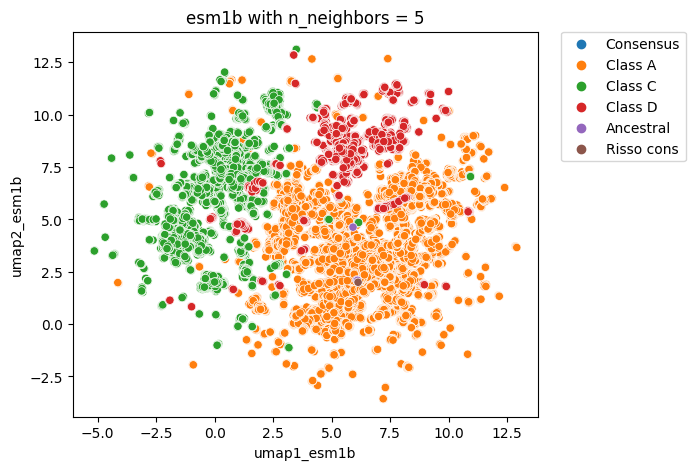

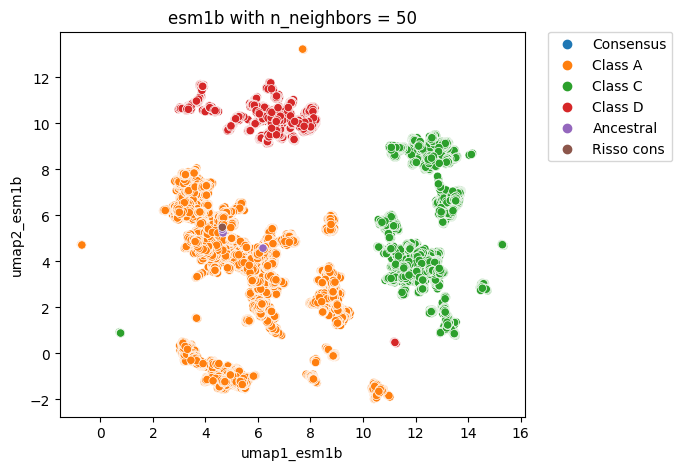

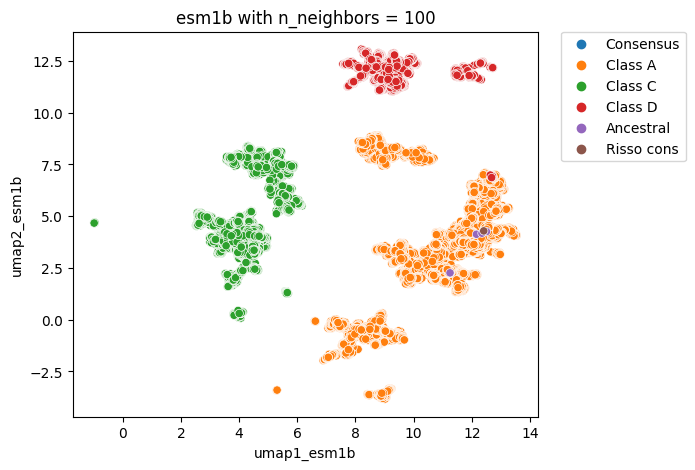

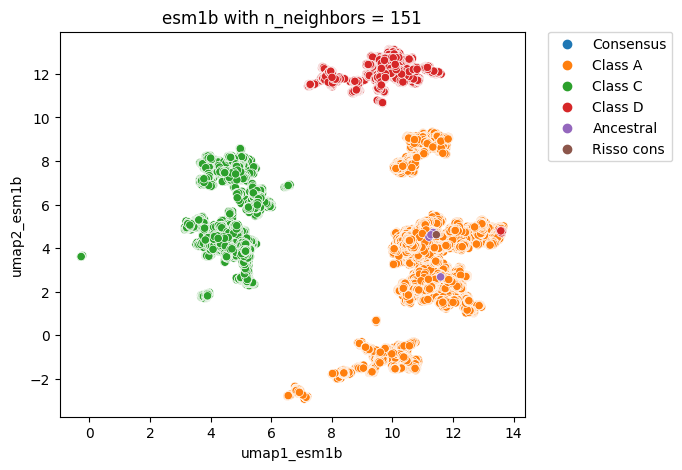

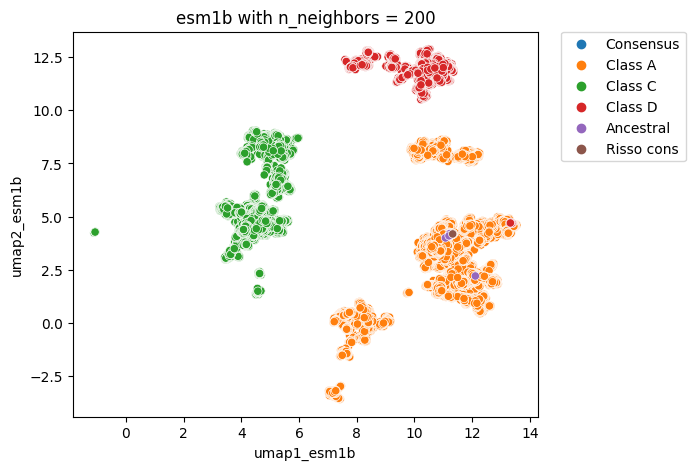

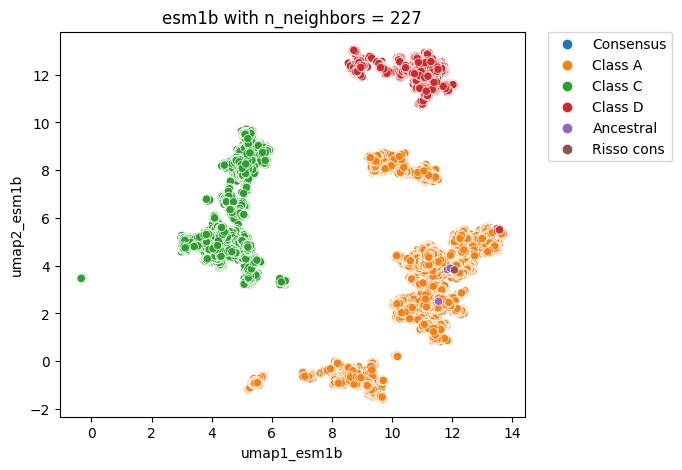

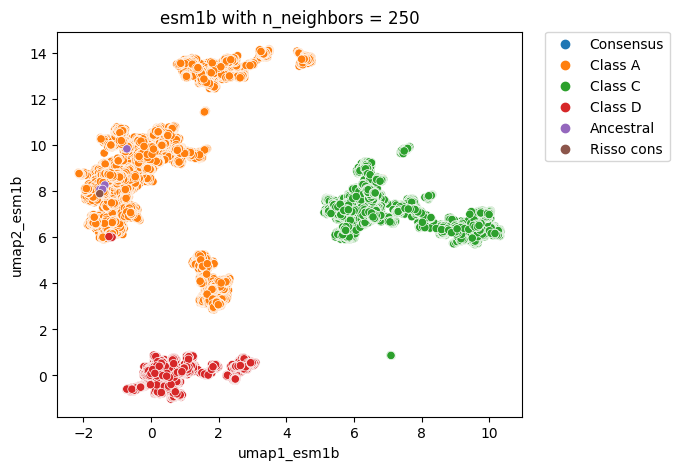

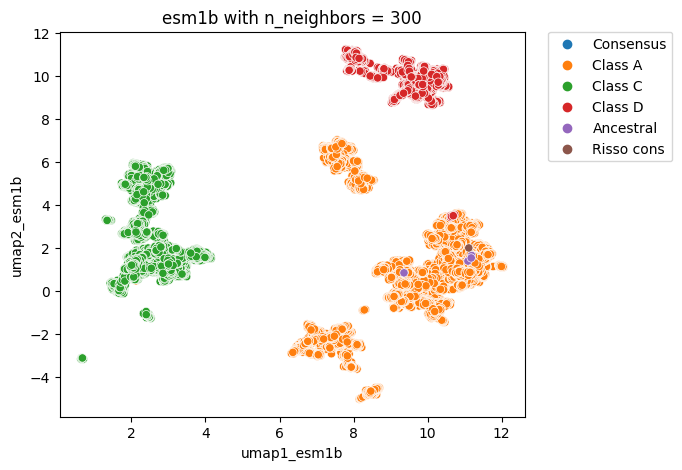

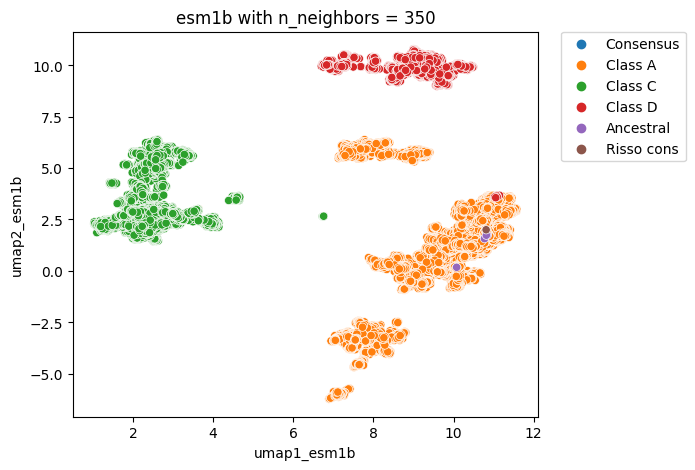

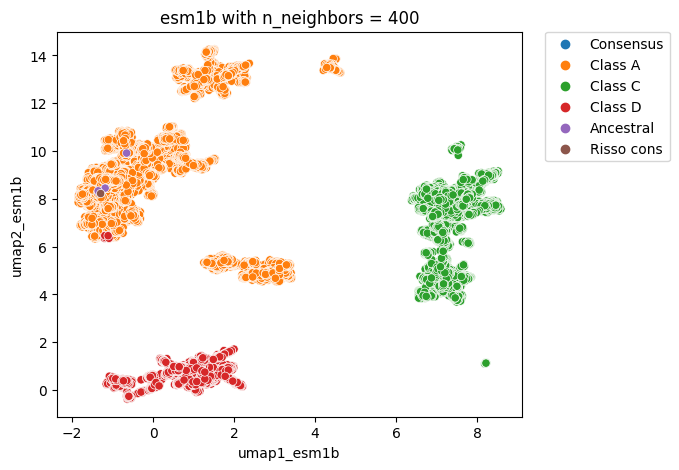

In [39]:
# set n_neigh vals to test
n_neighbors_lst = [5, 50, 100, 151, 200, 227, 250, 300, 350, 400]

for val  in n_neighbors_lst:
    
    # set names
    model = "esm1b"
    dim1 = "umap1_" + model
    dim2 = "umap2_" + model
    print(f"\n############# starting analysis for {model} with n_neighbors = {val} and spread/min_dist = 0.2 ###############\n")

    # compute umap
    umap_options = {"n_components": 2, "min_dist": 0.2, "spread": 0.2, "n_neighbors": val, "metric": "cosine"}
    proyected_dims = umap_reduce(df_sbl[model].to_list(), **umap_options)
    umap = pd.DataFrame(proyected_dims, columns=[dim1, dim2])
    umap = pd.concat([umap, df_sbl[["bla_subclass", "seq_id"]]], axis=1)
    
    # plot 
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data = umap, x = dim1, y = dim2, hue = "bla_subclass")
    plt.title(f"{model} with n_neighbors = {val}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    
    # save
    path = "../results/dim_redo/splitted_classes/umap/umap_2d_" + "nntest_sbl_" + str(val) + "_" + model  + ".csv"
    umap.pop("bla_subclass")
    umap.to_csv(path, index = False)
    print(f"csv file saved as: {path}")

## mindist-spread

### mbl


############# starting analysis for esm1b with mindist-spread = 0.1  ###############

UMAP(angular_rp_forest=True, metric='cosine', n_neighbors=400, random_state=420, spread=0.1, verbose=1)
Sun Jan  8 21:02:08 2023 Construct fuzzy simplicial set


/home/gama/anaconda3/envs/dl/lib/python3.8/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


Sun Jan  8 21:02:16 2023 Finding Nearest Neighbors
Sun Jan  8 21:02:17 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:02:17 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:02:24 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.1_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.2  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 21:02:24 2023 Construct fuzzy simplicial set
Sun Jan  8 21:02:33 2023 Finding Nearest Neighbors
Sun Jan  8 21:02:33 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:02:33 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:02:41 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.2_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.3  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.3, n_neighbors=400, random_state=420, spread=0.3, verbose=1)
Sun Jan  8 21:02:41 2023 Construct fuzzy simplicial set
Sun Jan  8 21:02:50 2023 Finding Nearest Neighbors
Sun Jan  8 21:02:50 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:02:50 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:02:57 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.3_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.4  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.4, n_neighbors=400, random_state=420, spread=0.4, verbose=1)
Sun Jan  8 21:02:58 2023 Construct fuzzy simplicial set
Sun Jan  8 21:03:06 2023 Finding Nearest Neighbors
Sun Jan  8 21:03:06 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:03:07 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:03:14 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.4_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.5  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.5, n_neighbors=400, random_state=420, spread=0.5, verbose=1)
Sun Jan  8 21:03:14 2023 Construct fuzzy simplicial set
Sun Jan  8 21:03:23 2023 Finding Nearest Neighbors
Sun Jan  8 21:03:23 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:03:23 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:03:30 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.5_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.6  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.6, n_neighbors=400, random_state=420, spread=0.6, verbose=1)
Sun Jan  8 21:03:30 2023 Construct fuzzy simplicial set
Sun Jan  8 21:03:39 2023 Finding Nearest Neighbors
Sun Jan  8 21:03:39 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:03:40 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:03:48 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.6_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.7  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.7, n_neighbors=400, random_state=420, spread=0.7, verbose=1)
Sun Jan  8 21:03:48 2023 Construct fuzzy simplicial set
Sun Jan  8 21:03:57 2023 Finding Nearest Neighbors
Sun Jan  8 21:03:57 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:03:57 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:04:04 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.7_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.8  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.8, n_neighbors=400, random_state=420, spread=0.8, verbose=1)
Sun Jan  8 21:04:04 2023 Construct fuzzy simplicial set
Sun Jan  8 21:04:13 2023 Finding Nearest Neighbors
Sun Jan  8 21:04:13 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:04:14 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:04:21 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.8_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.9  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.9, n_neighbors=400, random_state=420, spread=0.9, verbose=1)
Sun Jan  8 21:04:21 2023 Construct fuzzy simplicial set
Sun Jan  8 21:04:30 2023 Finding Nearest Neighbors
Sun Jan  8 21:04:30 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:04:30 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 21:04:37 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_mbl_0.9_esm1b.csv


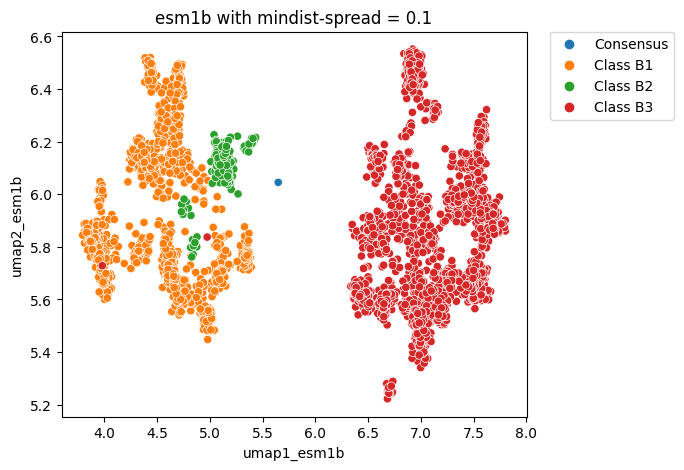

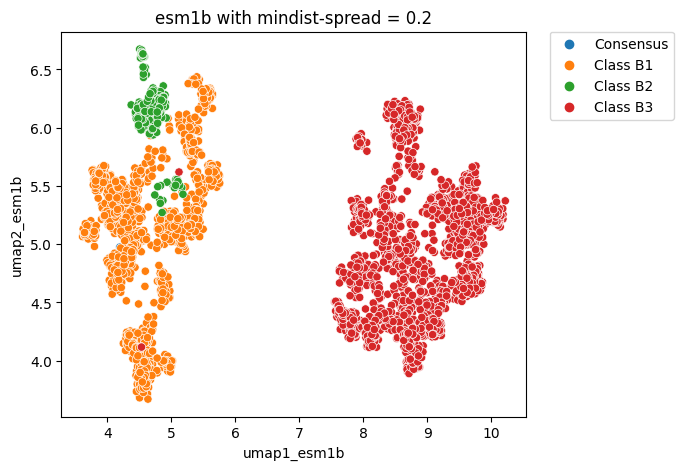

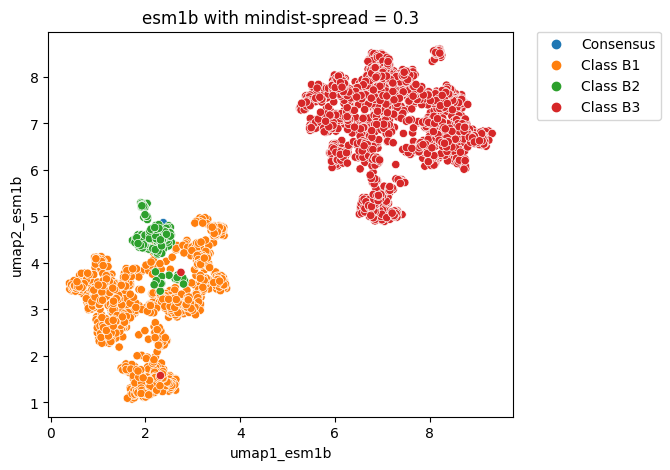

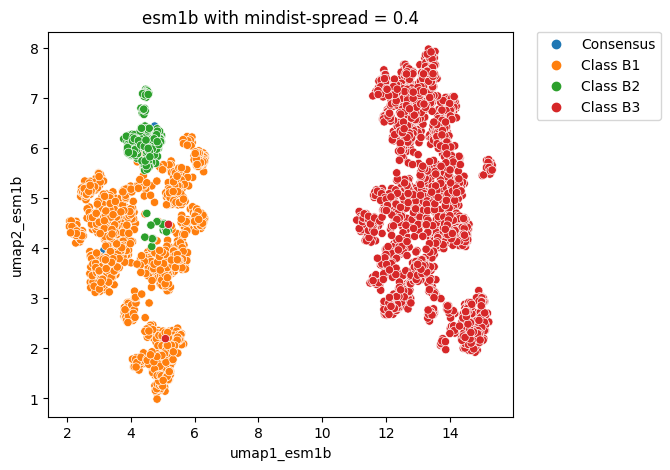

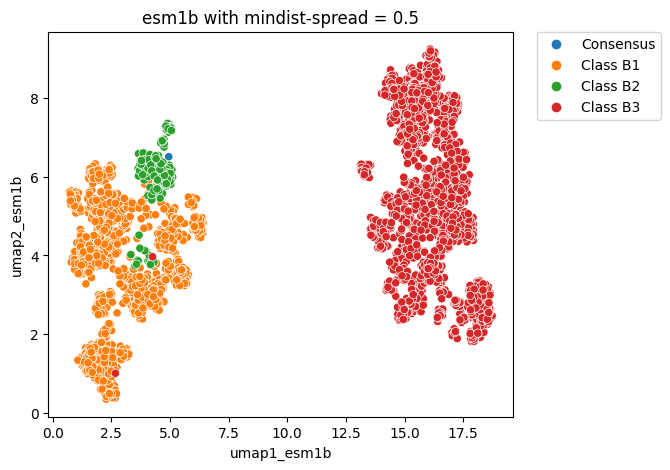

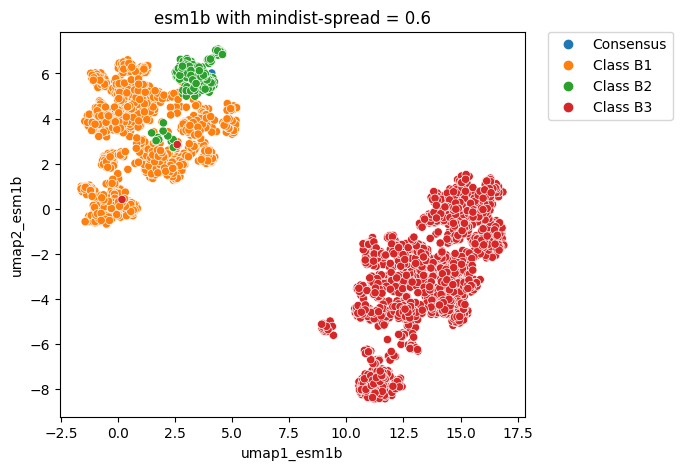

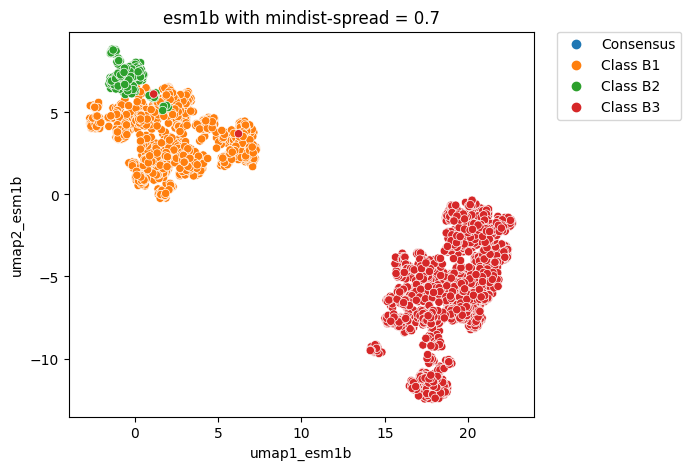

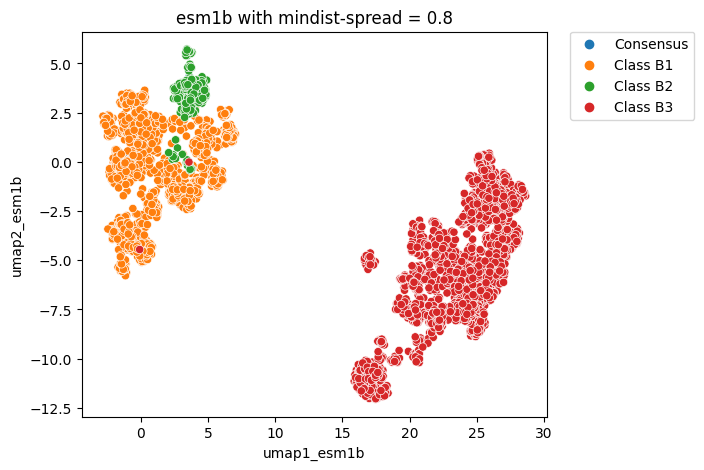

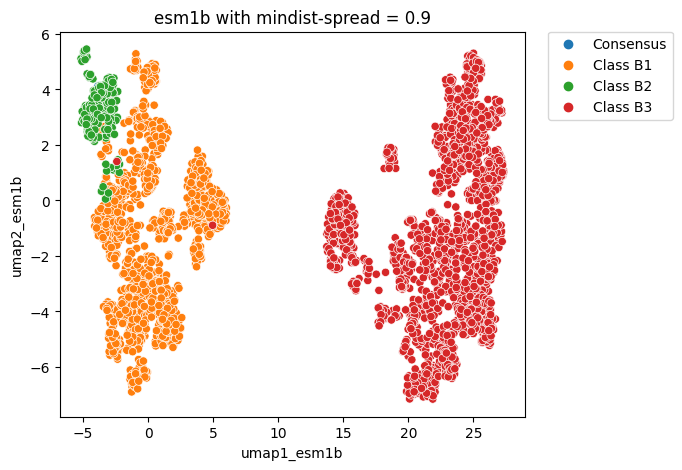

In [48]:
# set n_neigh vals to test
values_lst = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for val in values_lst:
    
    # set names
    model = "esm1b"
    dim1 = "umap1_" + model
    dim2 = "umap2_" + model
    print(f"\n############# starting analysis for {model} with mindist-spread = {val}  ###############\n")

    # compute umap
    umap_options = {"n_components": 2, "min_dist": val, "spread": val, "n_neighbors": 400, "metric": "cosine"}
    proyected_dims = umap_reduce(df_mbl[model].to_list(), **umap_options)
    umap = pd.DataFrame(proyected_dims, columns=[dim1, dim2])
    umap = pd.concat([umap, df_mbl[["bla_subclass", "seq_id"]]], axis=1)
    
    # plot 
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data = umap, x = dim1, y = dim2, hue = "bla_subclass")
    plt.title(f"{model} with mindist-spread = {val}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    
    # save
    path = "../results/dim_redo/splitted_classes/umap/umap_2d_" + "mdsptest_mbl_" + str(val) + "_" + model  + ".csv"
    umap.pop("bla_subclass")
    umap.to_csv(path, index = False)
    print(f"csv file saved as: {path}")

### sbl


############# starting analysis for esm1b with mindist-spread = 0.1  ###############

UMAP(angular_rp_forest=True, metric='cosine', n_neighbors=400, random_state=420, spread=0.1, verbose=1)
Sun Jan  8 21:06:12 2023 Construct fuzzy simplicial set
Sun Jan  8 21:06:12 2023 Finding Nearest Neighbors
Sun Jan  8 21:06:12 2023 Building RP forest with 13 trees


/home/gama/anaconda3/envs/dl/lib/python3.8/site-packages/umap/umap_.py:1356: RuntimeWarning: divide by zero encountered in power
  return 1.0 / (1.0 + a * x ** (2 * b))


Sun Jan  8 21:06:13 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:06:50 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:06:52 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:07:16 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.1_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.2  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 21:07:16 2023 Construct fuzzy simplicial set
Sun Jan  8 21:07:17 2023 Finding Nearest Neighbors
Sun Jan  8 21:07:17 2023 Building RP forest with 13 trees
Sun Jan  8 21:07:17 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:07:54 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:07:57 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:08:22 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.2_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.3  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.3, n_neighbors=400, random_state=420, spread=0.3, verbose=1)
Sun Jan  8 21:08:22 2023 Construct fuzzy simplicial set
Sun Jan  8 21:08:22 2023 Finding Nearest Neighbors
Sun Jan  8 21:08:22 2023 Building RP forest with 13 trees
Sun Jan  8 21:08:23 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:09:02 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:09:05 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:09:30 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.3_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.4  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.4, n_neighbors=400, random_state=420, spread=0.4, verbose=1)
Sun Jan  8 21:09:31 2023 Construct fuzzy simplicial set
Sun Jan  8 21:09:31 2023 Finding Nearest Neighbors
Sun Jan  8 21:09:31 2023 Building RP forest with 13 trees
Sun Jan  8 21:09:31 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:10:10 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:10:13 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:10:38 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.4_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.5  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.5, n_neighbors=400, random_state=420, spread=0.5, verbose=1)
Sun Jan  8 21:10:38 2023 Construct fuzzy simplicial set
Sun Jan  8 21:10:38 2023 Finding Nearest Neighbors
Sun Jan  8 21:10:38 2023 Building RP forest with 13 trees
Sun Jan  8 21:10:39 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:11:18 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:11:21 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:11:48 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.5_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.6  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.6, n_neighbors=400, random_state=420, spread=0.6, verbose=1)
Sun Jan  8 21:11:49 2023 Construct fuzzy simplicial set
Sun Jan  8 21:11:49 2023 Finding Nearest Neighbors
Sun Jan  8 21:11:49 2023 Building RP forest with 13 trees
Sun Jan  8 21:11:49 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:12:30 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:12:33 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:12:59 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.6_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.7  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.7, n_neighbors=400, random_state=420, spread=0.7, verbose=1)
Sun Jan  8 21:13:00 2023 Construct fuzzy simplicial set
Sun Jan  8 21:13:00 2023 Finding Nearest Neighbors
Sun Jan  8 21:13:00 2023 Building RP forest with 13 trees
Sun Jan  8 21:13:00 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:13:38 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:13:41 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:14:06 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.7_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.8  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.8, n_neighbors=400, random_state=420, spread=0.8, verbose=1)
Sun Jan  8 21:14:07 2023 Construct fuzzy simplicial set
Sun Jan  8 21:14:07 2023 Finding Nearest Neighbors
Sun Jan  8 21:14:07 2023 Building RP forest with 13 trees
Sun Jan  8 21:14:07 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:14:44 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:14:47 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:15:13 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.8_esm1b.csv

############# starting analysis for esm1b with mindist-spread = 0.9  ###############

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.9, n_neighbors=400, random_state=420, spread=0.9, verbose=1)
Sun Jan  8 21:15:13 2023 Construct fuzzy simplicial set
Sun Jan  8 21:15:13 2023 Finding Nearest Neighbors
Sun Jan  8 21:15:13 2023 Building RP forest with 13 trees
Sun Jan  8 21:15:13 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 21:15:51 2023 Finished Nearest Neighbor Search
Sun Jan  8 21:15:54 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 21:16:19 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_mdsptest_sbl_0.9_esm1b.csv


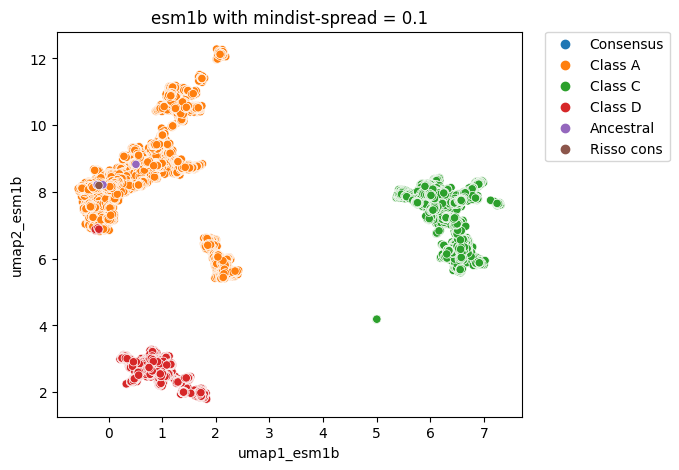

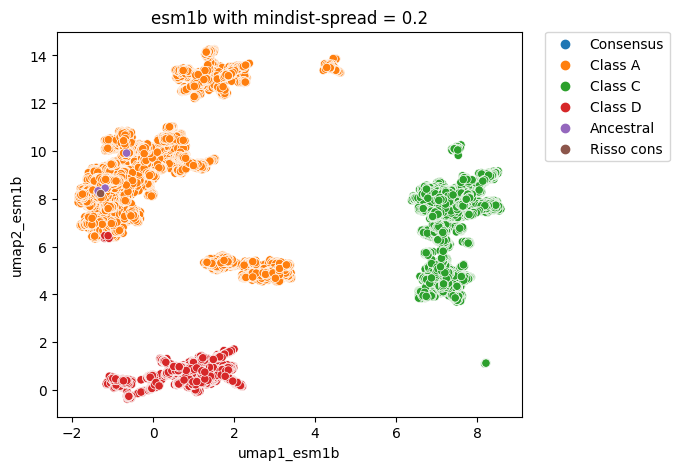

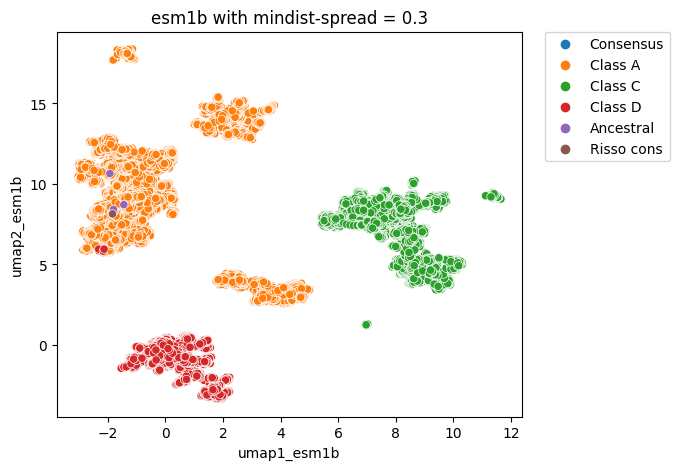

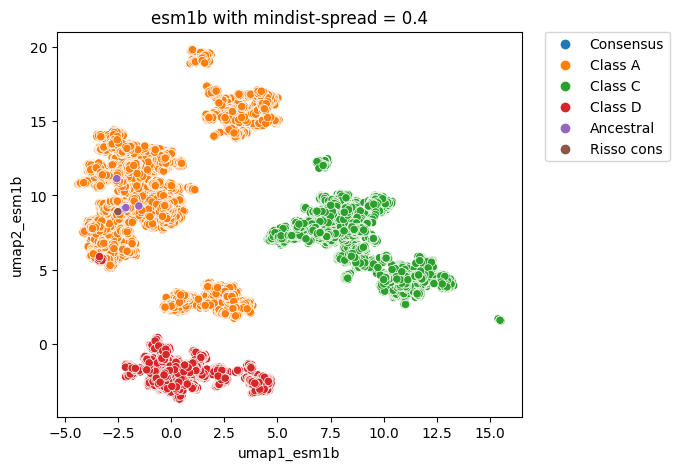

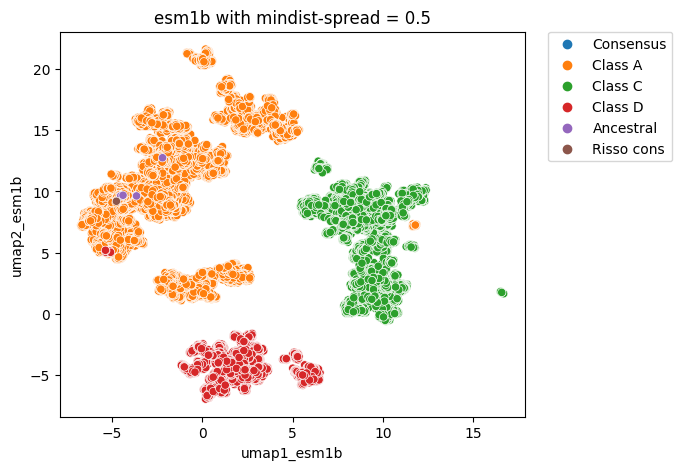

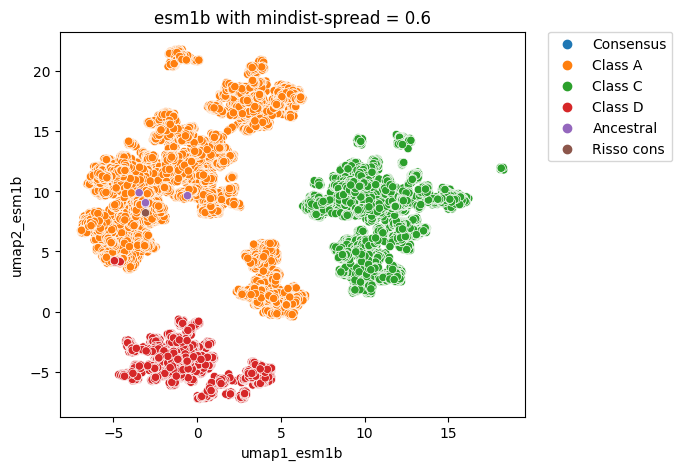

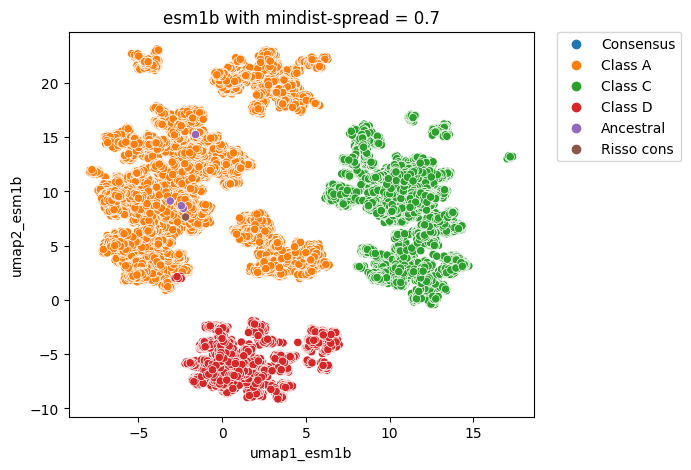

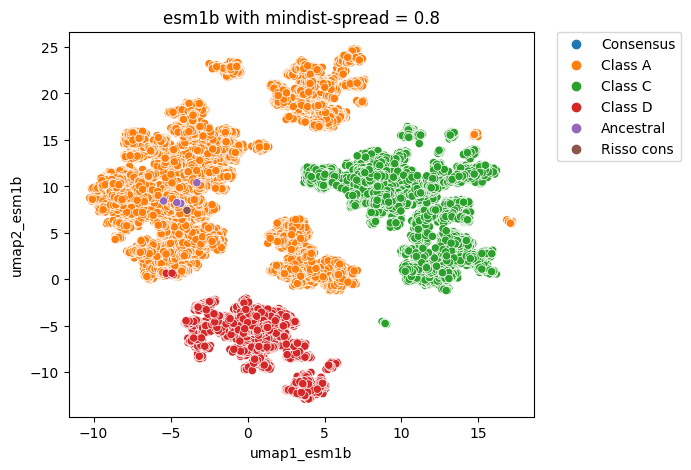

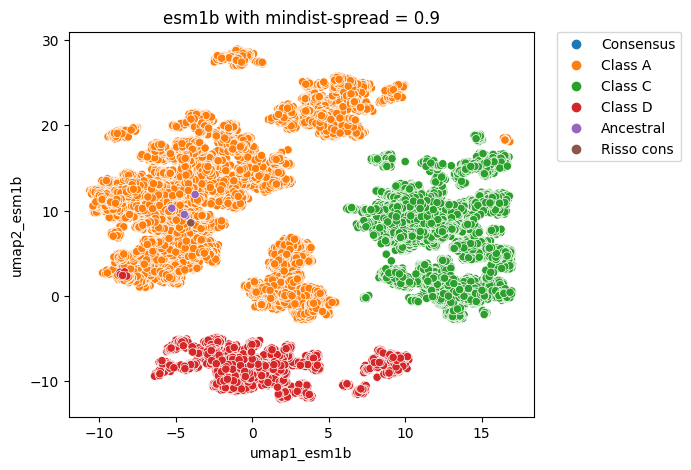

In [51]:
# set n_neigh vals to test
values_lst = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

for val in values_lst:
    
    # set names
    model = "esm1b"
    dim1 = "umap1_" + model
    dim2 = "umap2_" + model
    print(f"\n############# starting analysis for {model} with mindist-spread = {val}  ###############\n")

    # compute umap
    umap_options = {"n_components": 2, "min_dist": val, "spread": val, "n_neighbors": 400, "metric": "cosine"}
    proyected_dims = umap_reduce(df_sbl[model].to_list(), **umap_options)
    umap = pd.DataFrame(proyected_dims, columns=[dim1, dim2])
    umap = pd.concat([umap, df_sbl[["bla_subclass", "seq_id"]]], axis=1)
    
    # plot 
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data = umap, x = dim1, y = dim2, hue = "bla_subclass")
    plt.title(f"{model} with mindist-spread = {val}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    
    # save
    path = "../results/dim_redo/splitted_classes/umap/umap_2d_" + "mdsptest_sbl_" + str(val) + "_" + model  + ".csv"
    umap.pop("bla_subclass")
    umap.to_csv(path, index = False)
    print(f"csv file saved as: {path}")

## umap on all plm

In [57]:
# choose params that simulate the local approach of tSNE
# perplexity = n_neighbors

def do_umap(model, df_in, bla_class):
    
    """
    A quick function to do UMAP given a protein language model
    """
    
    # log
    print(f"\n#################### starting analysis for {model} ####################\n")
    
    # set names
    dim1 = "umap1_" + model
    dim2 = "umap2_" + model
    path = "../results/dim_redo/splitted_classes/umap/" + "umap_2d_plm_" + bla_class + "_" + model + ".csv"
    
    # compute umap
    umap_opt = {"n_components": 2, "min_dist": 0.2, "spread": 0.2, "n_neighbors": 400, "metric": "cosine"}
    proyected_dims = umap_reduce(df_in[model].to_list(), **umap_opt)
    umap = pd.DataFrame(proyected_dims, columns=[dim1, dim2])
    umap = pd.concat([umap, df_in[["bla_subclass", "seq_id"]]], axis=1)
    
    # plot 
    plt.figure(figsize=(6, 5))
    sns.scatterplot(data = umap, x = dim1, y = dim2, hue = "bla_subclass")
    plt.title(f"{model}")
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0)
    
    # save data
    umap.pop("bla_subclass")
    umap.to_csv(path, index = False)
    print(f"csv file saved as: {path}")

### mbl 


#################### starting analysis for esm1b ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:13:29 2023 Construct fuzzy simplicial set
Sun Jan  8 22:13:38 2023 Finding Nearest Neighbors
Sun Jan  8 22:13:38 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:13:38 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:13:45 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_esm1b.csv

#################### starting analysis for esm ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:13:45 2023 Construct fuzzy simplicial set
Sun Jan  8 22:13:53 2023 Finding Nearest Neighbors
Sun Jan  8 22:13:53 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:13:54 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:14:01 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_esm.csv

#################### starting analysis for aa_composition ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:14:01 2023 Construct fuzzy simplicial set
Sun Jan  8 22:14:04 2023 Finding Nearest Neighbors
Sun Jan  8 22:14:04 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:14:04 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:14:11 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_aa_composition.csv

#################### starting analysis for t5xlu50 ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:14:11 2023 Construct fuzzy simplicial set
Sun Jan  8 22:14:18 2023 Finding Nearest Neighbors
Sun Jan  8 22:14:18 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:14:19 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:14:26 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_t5xlu50.csv

#################### starting analysis for t5bfd ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:14:26 2023 Construct fuzzy simplicial set
Sun Jan  8 22:14:33 2023 Finding Nearest Neighbors
Sun Jan  8 22:14:33 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:14:33 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:14:41 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_t5bfd.csv

#################### starting analysis for xlnet ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:14:41 2023 Construct fuzzy simplicial set
Sun Jan  8 22:14:48 2023 Finding Nearest Neighbors
Sun Jan  8 22:14:48 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:14:48 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:14:55 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_xlnet.csv

#################### starting analysis for bepler ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:14:55 2023 Construct fuzzy simplicial set
Sun Jan  8 22:14:58 2023 Finding Nearest Neighbors
Sun Jan  8 22:14:58 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:14:59 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:15:07 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_bepler.csv

#################### starting analysis for carp640M ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:15:07 2023 Construct fuzzy simplicial set
Sun Jan  8 22:15:15 2023 Finding Nearest Neighbors
Sun Jan  8 22:15:15 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:15:16 2023 Construct embedding


Epochs completed:   0%|            0/500 [00:00]

Sun Jan  8 22:15:23 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_mbl_carp640M.csv


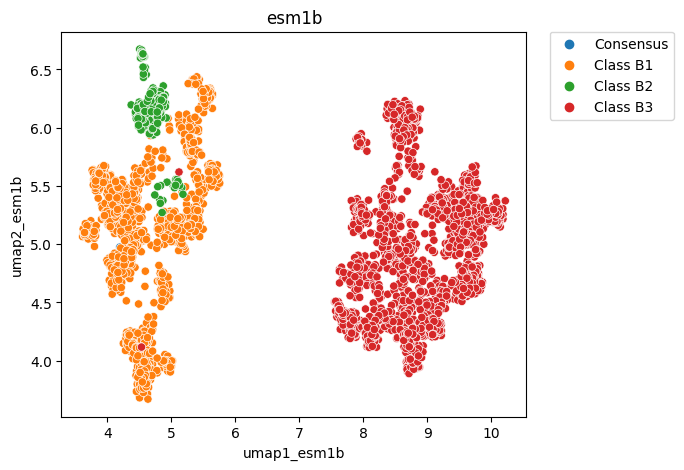

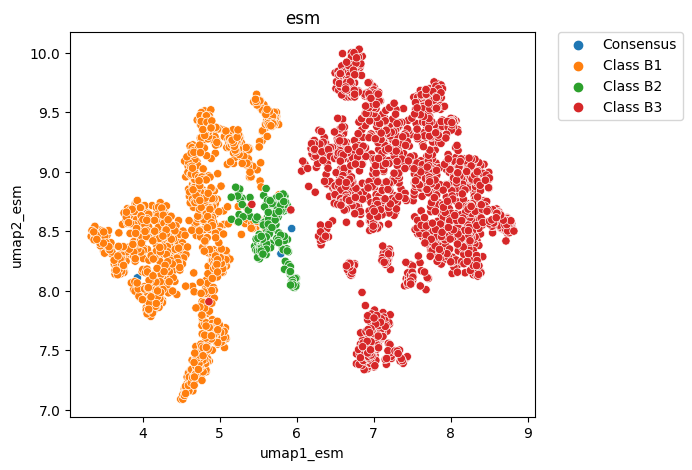

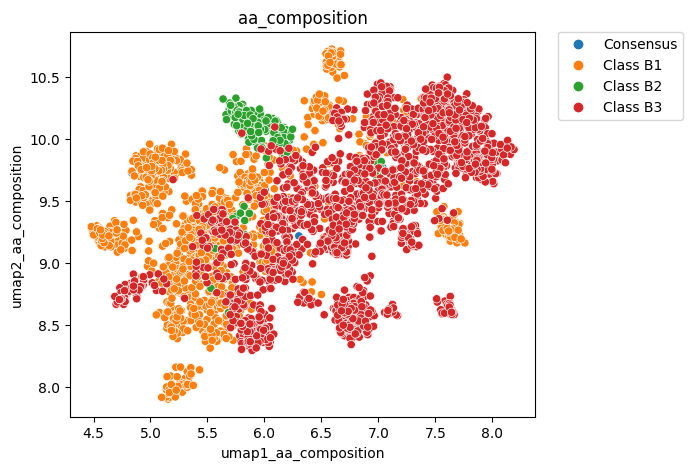

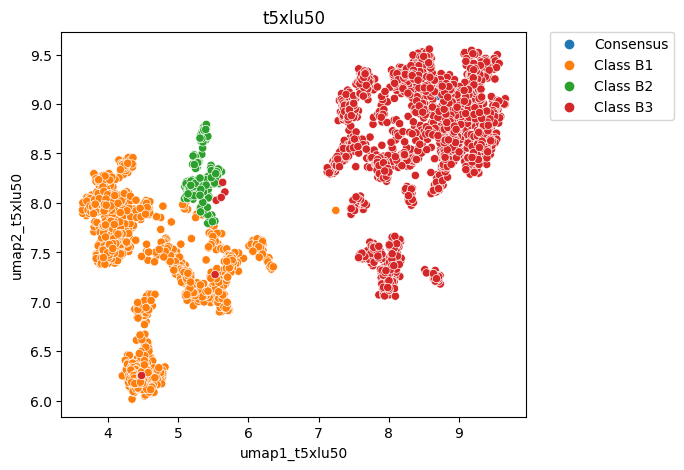

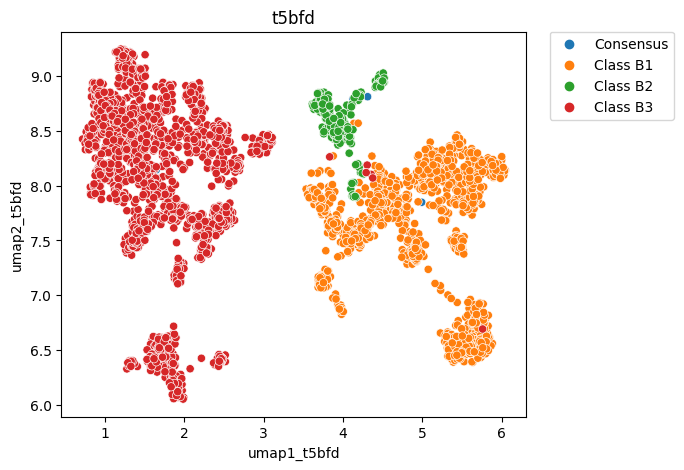

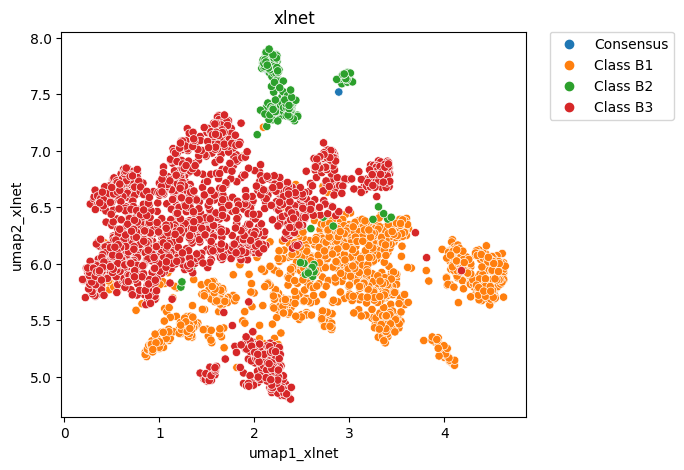

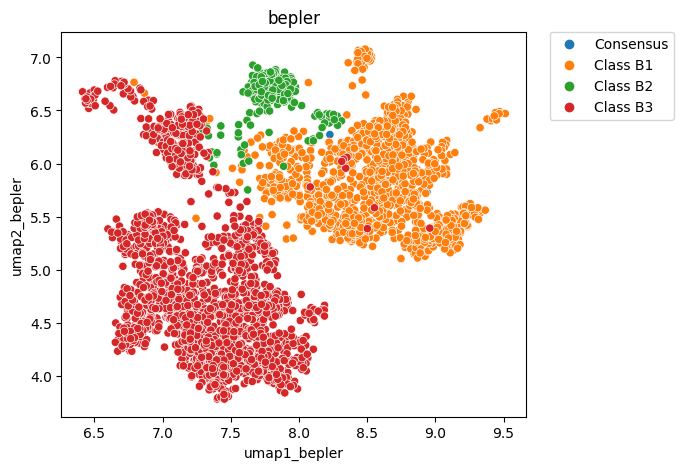

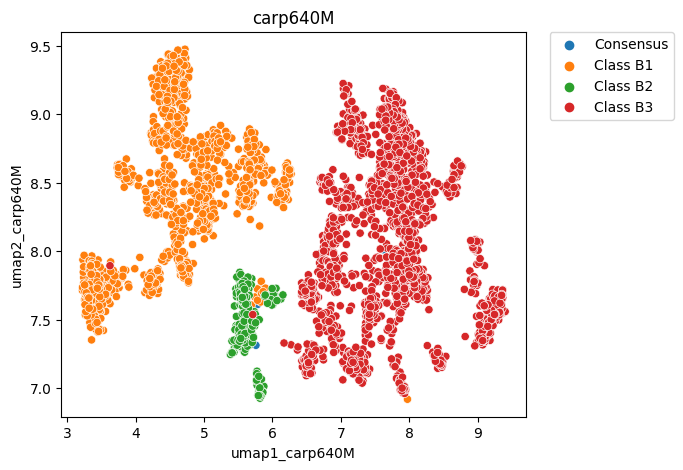

In [58]:
for model in models:
    do_umap(model, df_mbl, "mbl")

### sbl 


#################### starting analysis for esm1b ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:15:52 2023 Construct fuzzy simplicial set
Sun Jan  8 22:15:52 2023 Finding Nearest Neighbors
Sun Jan  8 22:15:52 2023 Building RP forest with 13 trees
Sun Jan  8 22:15:52 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 22:16:32 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:16:35 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:17:00 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_esm1b.csv

#################### starting analysis for esm ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:17:01 2023 Construct fuzzy simplicial set
Sun Jan  8 22:17:01 2023 Finding Nearest Neighbors
Sun Jan  8 22:17:01 2023 Building RP forest with 13 trees
Sun Jan  8 22:17:01 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 22:17:38 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:17:40 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:18:07 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_esm.csv

#################### starting analysis for aa_composition ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:18:07 2023 Construct fuzzy simplicial set
Sun Jan  8 22:18:07 2023 Finding Nearest Neighbors
Sun Jan  8 22:18:07 2023 Building RP forest with 13 trees
Sun Jan  8 22:18:07 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Sun Jan  8 22:18:35 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:18:38 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:18:59 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_aa_composition.csv

#################### starting analysis for t5xlu50 ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:18:59 2023 Construct fuzzy simplicial set
Sun Jan  8 22:18:59 2023 Finding Nearest Neighbors
Sun Jan  8 22:18:59 2023 Building RP forest with 13 trees
Sun Jan  8 22:19:00 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 22:19:32 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:19:34 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:20:02 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_t5xlu50.csv

#################### starting analysis for t5bfd ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:20:02 2023 Construct fuzzy simplicial set
Sun Jan  8 22:20:02 2023 Finding Nearest Neighbors
Sun Jan  8 22:20:02 2023 Building RP forest with 13 trees
Sun Jan  8 22:20:02 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 22:20:33 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:20:36 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:20:59 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_t5bfd.csv

#################### starting analysis for xlnet ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:21:00 2023 Construct fuzzy simplicial set
Sun Jan  8 22:21:00 2023 Finding Nearest Neighbors
Sun Jan  8 22:21:00 2023 Building RP forest with 13 trees
Sun Jan  8 22:21:00 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 22:21:34 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:21:37 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:22:01 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_xlnet.csv

#################### starting analysis for bepler ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:22:01 2023 Construct fuzzy simplicial set
Sun Jan  8 22:22:01 2023 Finding Nearest Neighbors
Sun Jan  8 22:22:01 2023 Building RP forest with 13 trees
Sun Jan  8 22:22:01 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Sun Jan  8 22:22:30 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:22:32 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:22:56 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_bepler.csv

#################### starting analysis for carp640M ####################

UMAP(angular_rp_forest=True, metric='cosine', min_dist=0.2, n_neighbors=400, random_state=420, spread=0.2, verbose=1)
Sun Jan  8 22:22:56 2023 Construct fuzzy simplicial set
Sun Jan  8 22:22:56 2023 Finding Nearest Neighbors
Sun Jan  8 22:22:56 2023 Building RP forest with 13 trees
Sun Jan  8 22:22:57 2023 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	Stopping threshold met -- exiting after 3 iterations
Sun Jan  8 22:23:34 2023 Finished Nearest Neighbor Search
Sun Jan  8 22:23:37 2023 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

Sun Jan  8 22:24:01 2023 Finished embedding
csv file saved as: ../results/dim_redo/splitted_classes/umap/umap_2d_plm_sbl_carp640M.csv


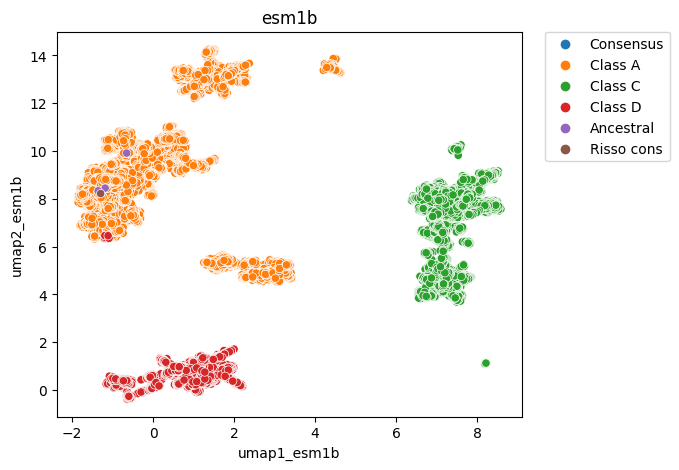

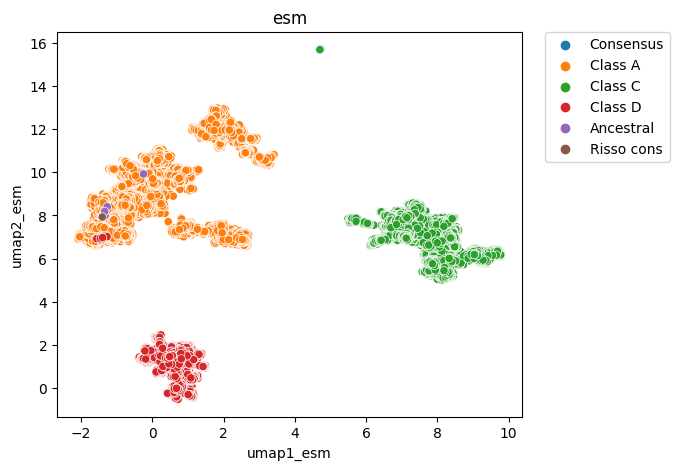

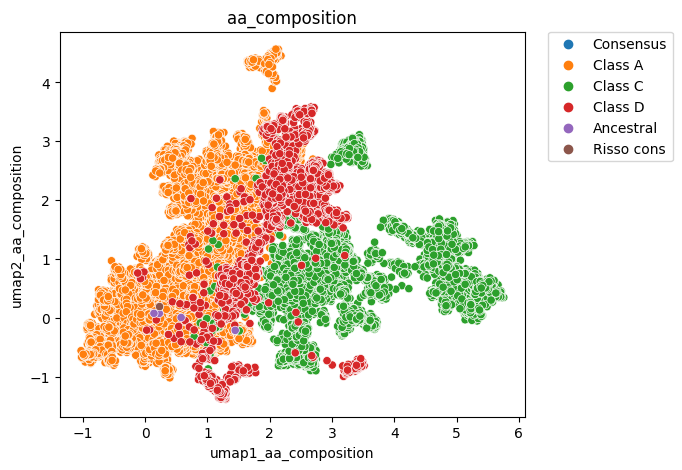

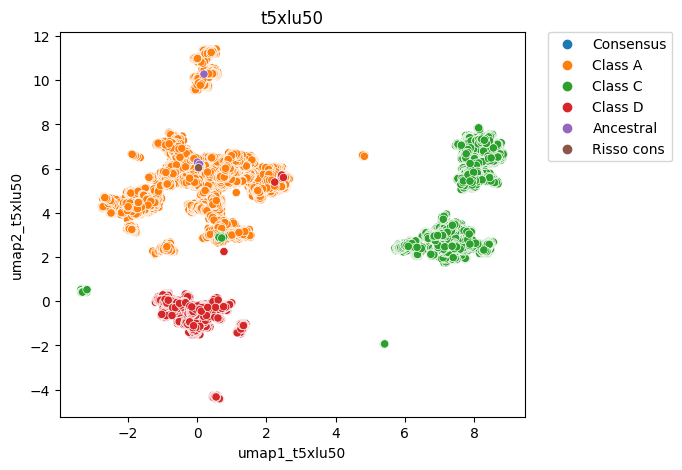

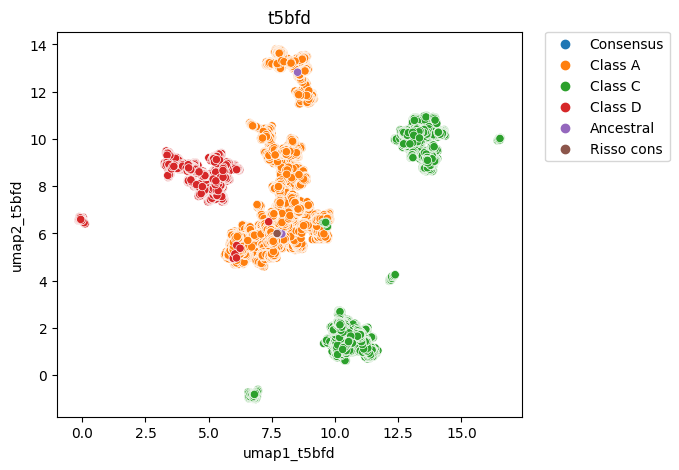

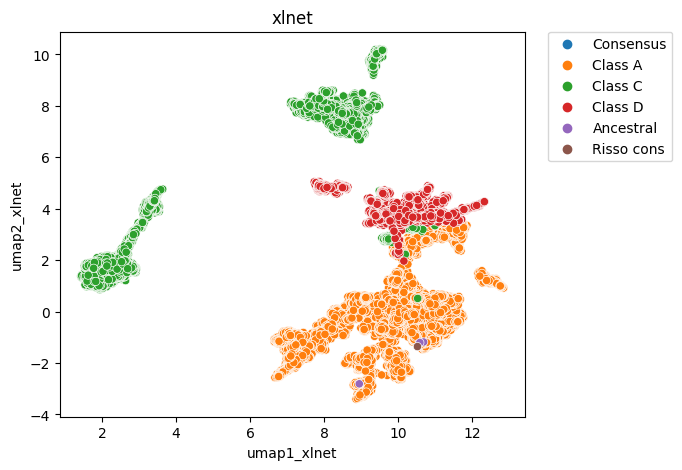

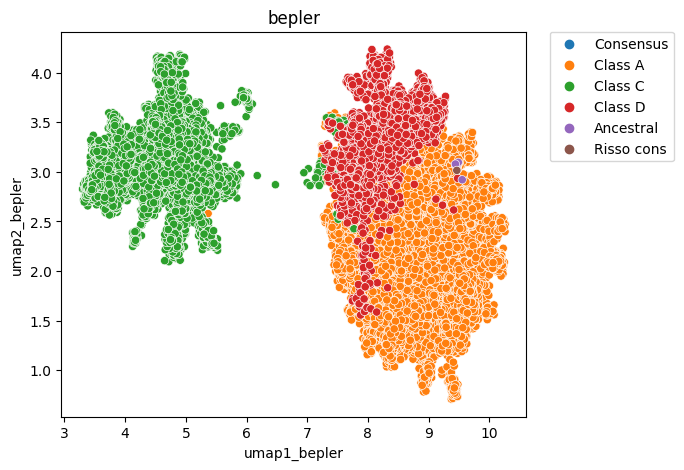

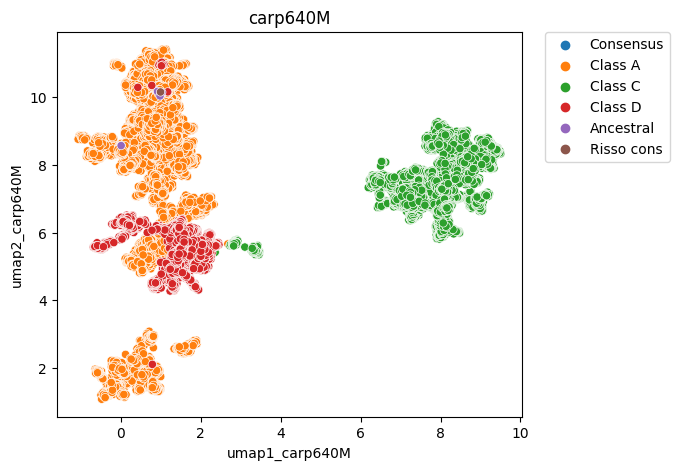

In [59]:
for model in models:
    do_umap(model, df_sbl, "sbl")

# panel plots

## PCA 

In [154]:
df_annot = pd.read_csv("../results/tables/df_annot_all.csv", sep = "\t")

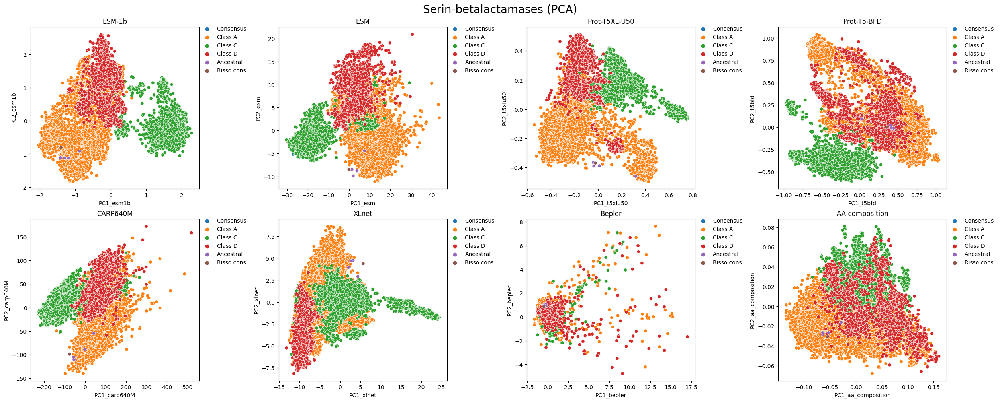

In [156]:
path = "../results/dim_redo/splitted_classes/pca/" 

# list
csvs = [] 

# load csvs 
for file in os.listdir(path):
    if file.startswith("pca_2d_sbl_"): 
        csvs.append(file)

# append dsets to a list
li = []
for dset in csvs:
    path2 = path + dset
    df = pd.read_csv(path2, index_col=None, header=0)
    li.append(df)

# concatenate and add new cols
df = pd.concat(li, axis=1, ignore_index=False)

# remove duplicates
df = df.loc[:, ~df.columns.duplicated()]

# merge annots 
df = df.merge(df_annot, on = "seq_id")

# set panel 
# https://stackoverflow.com/questions/9834452/how-do-i-make-a-single-legend-for-many-subplots
mosaic = """
    ABCD
    EFGH
"""
color = "bla_subclass"
# plot 
ax = plt.figure(figsize=(25,10), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(data= df, x= "PC1_esm1b",          y = "PC2_esm1b",          hue = color, ax = ax["A"])
sns.scatterplot(data= df, x= "PC1_esm",            y = "PC2_esm",            hue = color, ax = ax["B"])
sns.scatterplot(data= df, x= "PC1_t5xlu50",        y = "PC2_t5xlu50",        hue = color, ax = ax["C"])
sns.scatterplot(data= df, x= "PC1_t5bfd",          y = "PC2_t5bfd",          hue = color, ax = ax["D"])
sns.scatterplot(data= df, x= "PC1_carp640M",       y = "PC2_carp640M",       hue = color, ax = ax["E"])
sns.scatterplot(data= df, x= "PC1_xlnet",          y = "PC2_xlnet",          hue = color, ax = ax["F"])
sns.scatterplot(data= df, x= "PC1_bepler",         y = "PC2_bepler",         hue = color, ax = ax["G"])
sns.scatterplot(data= df, x= "PC1_aa_composition", y = "PC2_aa_composition", hue = color, ax = ax["H"])

ax["A"].set_title("ESM-1b")
ax["B"].set_title("ESM")
ax["C"].set_title("Prot-T5XL-U50")
ax["D"].set_title("Prot-T5-BFD")
ax["E"].set_title("CARP640M")
ax["F"].set_title("XLnet")
ax["G"].set_title("Bepler")
ax["H"].set_title("AA composition")

for i in "ABCDEFGH":
    ax[i].legend(frameon=False,loc=(0,0), bbox_to_anchor=(1.001, 0.7)) #.remove()

plt.suptitle("Serin-betalactamases (PCA)",fontsize=20)

df.to_csv("../results/dim_redo/splitted_classes/pca/all_plm_sbl.csv", index = False)

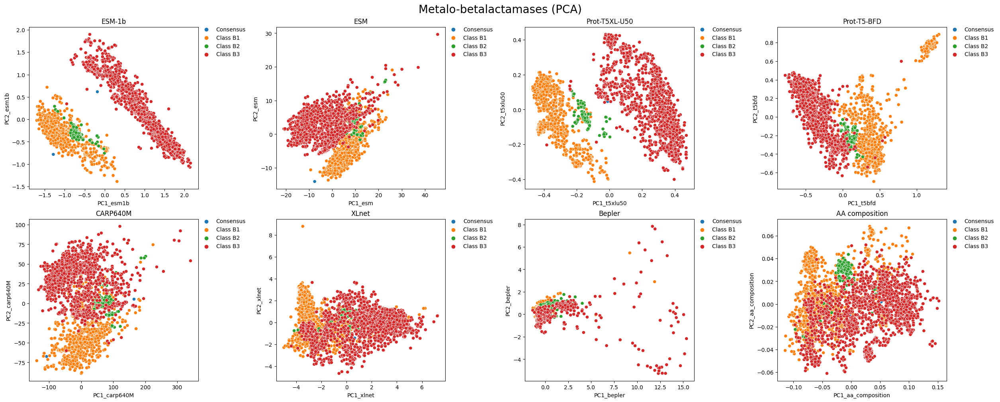

In [172]:
path = "../results/dim_redo/splitted_classes/pca/"

# list
csvs = [] 

# load csvs 
for file in os.listdir(path):
    if file.startswith("pca_2d_mbl_"): 
        csvs.append(file)

# append dsets to a list
li = []
for dset in csvs:
    path2 = path + dset
    df = pd.read_csv(path2, index_col=None, header=0)
    li.append(df)

# concatenate and add new cols
df = pd.concat(li, axis=1, ignore_index=False)

# remove duplicates
df = df.loc[:, ~df.columns.duplicated()]

# merge annots 
df = df.merge(df_annot, on = "seq_id")

# set panel 
# https://stackoverflow.com/questions/9834452/how-do-i-make-a-single-legend-for-many-subplots
mosaic = """
    ABCD
    EFGH
"""
color = "bla_subclass"
# plot 
ax = plt.figure(figsize=(25,10), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(data= df, x= "PC1_esm1b",          y = "PC2_esm1b",          hue = color, ax = ax["A"])
sns.scatterplot(data= df, x= "PC1_esm",            y = "PC2_esm",            hue = color, ax = ax["B"])
sns.scatterplot(data= df, x= "PC1_t5xlu50",        y = "PC2_t5xlu50",        hue = color, ax = ax["C"])
sns.scatterplot(data= df, x= "PC1_t5bfd",          y = "PC2_t5bfd",          hue = color, ax = ax["D"])
sns.scatterplot(data= df, x= "PC1_carp640M",       y = "PC2_carp640M",       hue = color, ax = ax["E"])
sns.scatterplot(data= df, x= "PC1_xlnet",          y = "PC2_xlnet",          hue = color, ax = ax["F"])
sns.scatterplot(data= df, x= "PC1_bepler",         y = "PC2_bepler",         hue = color, ax = ax["G"])
sns.scatterplot(data= df, x= "PC1_aa_composition", y = "PC2_aa_composition", hue = color, ax = ax["H"])

ax["A"].set_title("ESM-1b")
ax["B"].set_title("ESM")
ax["C"].set_title("Prot-T5XL-U50")
ax["D"].set_title("Prot-T5-BFD")
ax["E"].set_title("CARP640M")
ax["F"].set_title("XLnet")
ax["G"].set_title("Bepler")
ax["H"].set_title("AA composition")

for i in "ABCDEFGH":
    ax[i].legend(frameon=False,loc=(0,0), bbox_to_anchor=(1.001, 0.8)) #.remove()

plt.suptitle("Metalo-betalactamases (PCA)",fontsize=20)

df.to_csv("../results/dim_redo/splitted_classes/pca/all_plm_mbl.csv", index = False)

## tsne 

Text(0.5, 0.98, 'Serin-betalactamases (tSNE)')

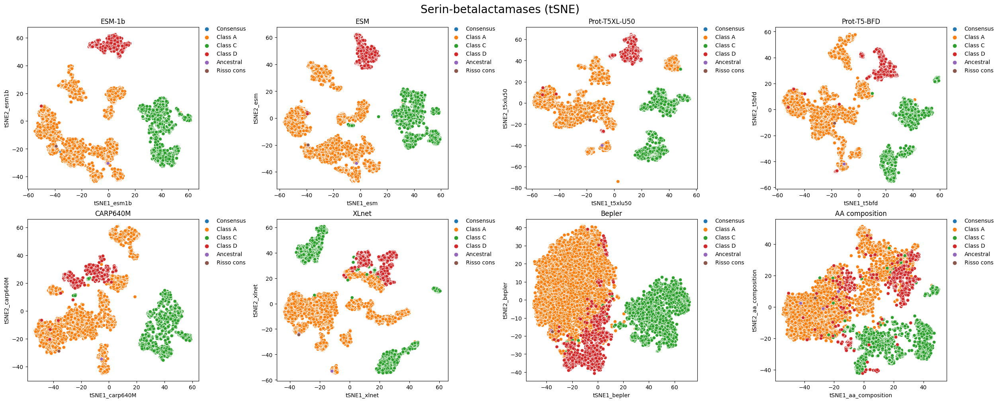

In [161]:
path = "../results/dim_redo/splitted_classes/tsne/" 

# list
csvs = [] 

# load csvs 
for file in os.listdir(path):
    if file.startswith("tsne_2d_plm_sbl"): 
        csvs.append(file)

# append dsets to a list
li = []
for dset in csvs:
    path2 = path + dset
    df = pd.read_csv(path2, index_col=None, header=0)
    li.append(df)

# concatenate and add new cols
df = pd.concat(li, axis=1, ignore_index=False)

# remove duplicates
df = df.loc[:, ~df.columns.duplicated()]

# merge annots 
df = df.merge(df_annot, on = "seq_id")

# set panel 
# https://stackoverflow.com/questions/9834452/how-do-i-make-a-single-legend-for-many-subplots
mosaic = """
    ABCD
    EFGH
"""
color = "bla_subclass"
# plot 
ax = plt.figure(figsize=(25,10), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(data= df, x= "tSNE1_esm1b",          y = "tSNE2_esm1b",          hue = color, ax = ax["A"])
sns.scatterplot(data= df, x= "tSNE1_esm",            y = "tSNE2_esm",            hue = color, ax = ax["B"])
sns.scatterplot(data= df, x= "tSNE1_t5xlu50",        y = "tSNE2_t5xlu50",        hue = color, ax = ax["C"])
sns.scatterplot(data= df, x= "tSNE1_t5bfd",          y = "tSNE2_t5bfd",          hue = color, ax = ax["D"])
sns.scatterplot(data= df, x= "tSNE1_carp640M",       y = "tSNE2_carp640M",       hue = color, ax = ax["E"])
sns.scatterplot(data= df, x= "tSNE1_xlnet",          y = "tSNE2_xlnet",          hue = color, ax = ax["F"])
sns.scatterplot(data= df, x= "tSNE1_bepler",         y = "tSNE2_bepler",         hue = color, ax = ax["G"])
sns.scatterplot(data= df, x= "tSNE1_aa_composition", y = "tSNE2_aa_composition", hue = color, ax = ax["H"])

ax["A"].set_title("ESM-1b")
ax["B"].set_title("ESM")
ax["C"].set_title("Prot-T5XL-U50")
ax["D"].set_title("Prot-T5-BFD")
ax["E"].set_title("CARP640M")
ax["F"].set_title("XLnet")
ax["G"].set_title("Bepler")
ax["H"].set_title("AA composition")

for i in "ABCDEFGH":
    ax[i].legend(frameon=False,loc=(0,0), bbox_to_anchor=(1.001, 0.7)) #.remove()

plt.suptitle("Serin-betalactamases (tSNE)",fontsize=20)

In [160]:
df.to_csv("../results/dim_redo/splitted_classes/tsne/all_plm_sbl.csv", index = False)

Text(0.5, 0.98, 'Metalo-betalactamases (tSNE)')

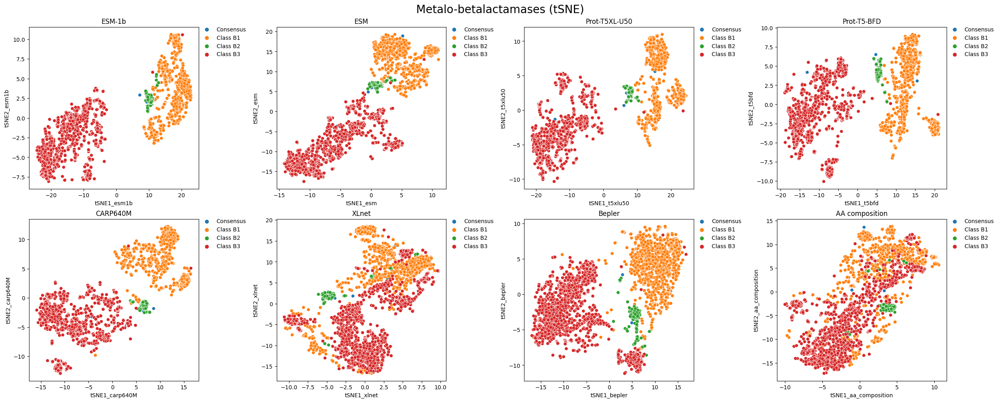

In [173]:
path = "../results/dim_redo/splitted_classes/tsne/" 

# list
csvs = [] 

# load csvs 
for file in os.listdir(path):
    if file.startswith("tsne_2d_plm_mbl"): 
        csvs.append(file)

# append dsets to a list
li = []
for dset in csvs:
    path2 = path + dset
    df = pd.read_csv(path2, index_col=None, header=0)
    li.append(df)

# concatenate and add new cols
df = pd.concat(li, axis=1, ignore_index=False)

# remove duplicates
df = df.loc[:, ~df.columns.duplicated()]

# merge annots 
df = df.merge(df_annot, on = "seq_id")

# set panel 
# https://stackoverflow.com/questions/9834452/how-do-i-make-a-single-legend-for-many-subplots
mosaic = """
    ABCD
    EFGH
"""
color = "bla_subclass"
# plot 
ax = plt.figure(figsize=(25,10), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(data= df, x= "tSNE1_esm1b",          y = "tSNE2_esm1b",          hue = color, ax = ax["A"])
sns.scatterplot(data= df, x= "tSNE1_esm",            y = "tSNE2_esm",            hue = color, ax = ax["B"])
sns.scatterplot(data= df, x= "tSNE1_t5xlu50",        y = "tSNE2_t5xlu50",        hue = color, ax = ax["C"])
sns.scatterplot(data= df, x= "tSNE1_t5bfd",          y = "tSNE2_t5bfd",          hue = color, ax = ax["D"])
sns.scatterplot(data= df, x= "tSNE1_carp640M",       y = "tSNE2_carp640M",       hue = color, ax = ax["E"])
sns.scatterplot(data= df, x= "tSNE1_xlnet",          y = "tSNE2_xlnet",          hue = color, ax = ax["F"])
sns.scatterplot(data= df, x= "tSNE1_bepler",         y = "tSNE2_bepler",         hue = color, ax = ax["G"])
sns.scatterplot(data= df, x= "tSNE1_aa_composition", y = "tSNE2_aa_composition", hue = color, ax = ax["H"])

ax["A"].set_title("ESM-1b")
ax["B"].set_title("ESM")
ax["C"].set_title("Prot-T5XL-U50")
ax["D"].set_title("Prot-T5-BFD")
ax["E"].set_title("CARP640M")
ax["F"].set_title("XLnet")
ax["G"].set_title("Bepler")
ax["H"].set_title("AA composition")

for i in "ABCDEFGH":
    ax[i].legend(frameon=False,loc=(0,0), bbox_to_anchor=(1.001, 0.8)) #.remove()

plt.suptitle("Metalo-betalactamases (tSNE)",fontsize=20)

In [166]:
df.to_csv("../results/dim_redo/splitted_classes/tsne/all_plm_mbl.csv", index = False)

## umap 

Text(0.5, 0.98, 'Serin-betalactamases (UMAP)')

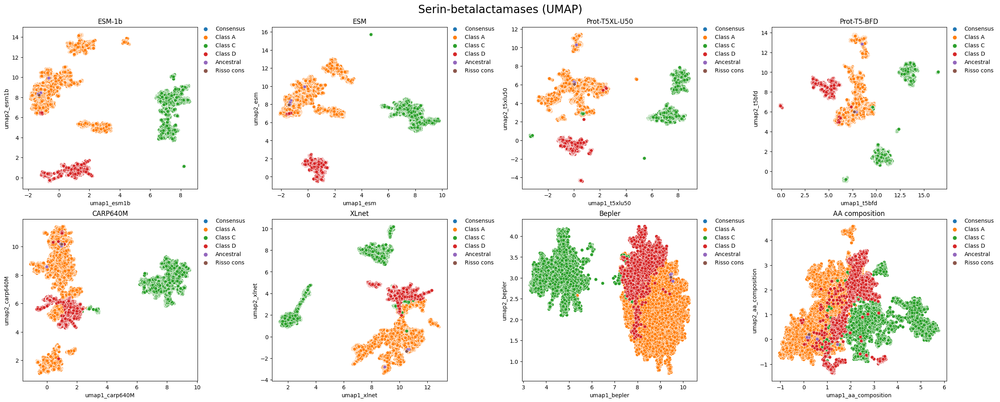

In [167]:
path = "../results/dim_redo/splitted_classes/umap/" 

# list
csvs = [] 

# load csvs 
for file in os.listdir(path):
    if file.startswith("umap_2d_plm_sbl"): 
        csvs.append(file)

# append dsets to a list
li = []
for dset in csvs:
    path2 = path + dset
    df = pd.read_csv(path2, index_col=None, header=0)
    li.append(df)

# concatenate and add new cols
df = pd.concat(li, axis=1, ignore_index=False)

# remove duplicates
df = df.loc[:, ~df.columns.duplicated()]

# merge annots 
df = df.merge(df_annot, on = "seq_id")

# set panel 
# https://stackoverflow.com/questions/9834452/how-do-i-make-a-single-legend-for-many-subplots
mosaic = """
    ABCD
    EFGH
"""
color = "bla_subclass"
# plot 
ax = plt.figure(figsize=(25,10), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(data= df, x= "umap1_esm1b",          y = "umap2_esm1b",          hue = color, ax = ax["A"])
sns.scatterplot(data= df, x= "umap1_esm",            y = "umap2_esm",            hue = color, ax = ax["B"])
sns.scatterplot(data= df, x= "umap1_t5xlu50",        y = "umap2_t5xlu50",        hue = color, ax = ax["C"])
sns.scatterplot(data= df, x= "umap1_t5bfd",          y = "umap2_t5bfd",          hue = color, ax = ax["D"])
sns.scatterplot(data= df, x= "umap1_carp640M",       y = "umap2_carp640M",       hue = color, ax = ax["E"])
sns.scatterplot(data= df, x= "umap1_xlnet",          y = "umap2_xlnet",          hue = color, ax = ax["F"])
sns.scatterplot(data= df, x= "umap1_bepler",         y = "umap2_bepler",         hue = color, ax = ax["G"])
sns.scatterplot(data= df, x= "umap1_aa_composition", y = "umap2_aa_composition", hue = color, ax = ax["H"])

ax["A"].set_title("ESM-1b")
ax["B"].set_title("ESM")
ax["C"].set_title("Prot-T5XL-U50")
ax["D"].set_title("Prot-T5-BFD")
ax["E"].set_title("CARP640M")
ax["F"].set_title("XLnet")
ax["G"].set_title("Bepler")
ax["H"].set_title("AA composition")

for i in "ABCDEFGH":
    ax[i].legend(frameon=False,loc=(0,0), bbox_to_anchor=(1.001, 0.7)) #.remove()

plt.suptitle("Serin-betalactamases (UMAP)",fontsize=20)

In [168]:
df.to_csv("../results/dim_redo/splitted_classes/umap/all_plm_sbl.csv", index = False)

Text(0.5, 0.98, 'Metalo-betalactamases (UMAP)')

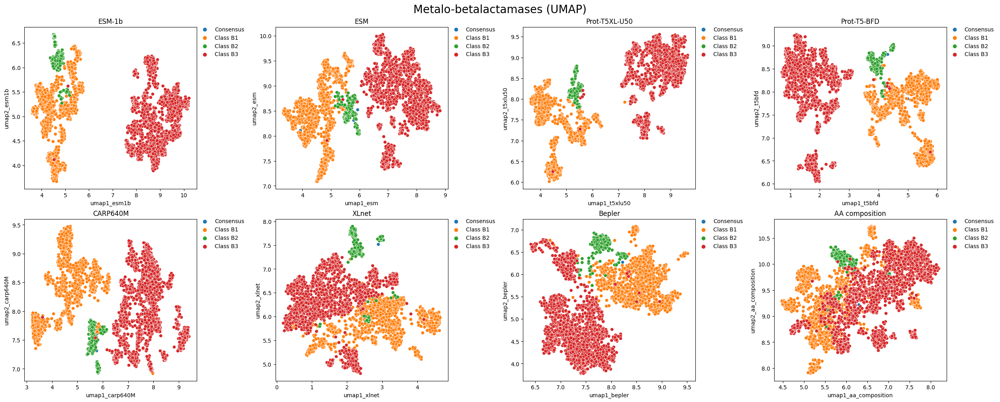

In [174]:
path = "../results/dim_redo/splitted_classes/umap/" 

# list
csvs = [] 

# load csvs 
for file in os.listdir(path):
    if file.startswith("umap_2d_plm_mbl"): 
        csvs.append(file)

# append dsets to a list
li = []
for dset in csvs:
    path2 = path + dset
    df = pd.read_csv(path2, index_col=None, header=0)
    li.append(df)

# concatenate and add new cols
df = pd.concat(li, axis=1, ignore_index=False)

# remove duplicates
df = df.loc[:, ~df.columns.duplicated()]

# merge annots 
df = df.merge(df_annot, on = "seq_id")

# set panel 
# https://stackoverflow.com/questions/9834452/how-do-i-make-a-single-legend-for-many-subplots
mosaic = """
    ABCD
    EFGH
"""
color = "bla_subclass"
# plot 
ax = plt.figure(figsize=(25,10), constrained_layout = True).subplot_mosaic(mosaic) 

sns.scatterplot(data= df, x= "umap1_esm1b",          y = "umap2_esm1b",          hue = color, ax = ax["A"])
sns.scatterplot(data= df, x= "umap1_esm",            y = "umap2_esm",            hue = color, ax = ax["B"])
sns.scatterplot(data= df, x= "umap1_t5xlu50",        y = "umap2_t5xlu50",        hue = color, ax = ax["C"])
sns.scatterplot(data= df, x= "umap1_t5bfd",          y = "umap2_t5bfd",          hue = color, ax = ax["D"])
sns.scatterplot(data= df, x= "umap1_carp640M",       y = "umap2_carp640M",       hue = color, ax = ax["E"])
sns.scatterplot(data= df, x= "umap1_xlnet",          y = "umap2_xlnet",          hue = color, ax = ax["F"])
sns.scatterplot(data= df, x= "umap1_bepler",         y = "umap2_bepler",         hue = color, ax = ax["G"])
sns.scatterplot(data= df, x= "umap1_aa_composition", y = "umap2_aa_composition", hue = color, ax = ax["H"])

ax["A"].set_title("ESM-1b")
ax["B"].set_title("ESM")
ax["C"].set_title("Prot-T5XL-U50")
ax["D"].set_title("Prot-T5-BFD")
ax["E"].set_title("CARP640M")
ax["F"].set_title("XLnet")
ax["G"].set_title("Bepler")
ax["H"].set_title("AA composition")

for i in "ABCDEFGH":
    ax[i].legend(frameon=False,loc=(0,0), bbox_to_anchor=(1.001, 0.8)) #.remove()

plt.suptitle("Metalo-betalactamases (UMAP)",fontsize=20)

In [170]:
df.to_csv("../results/dim_redo/splitted_classes/umap/all_plm_mbl.csv", index = False)

fin